In [4]:
library(ggplot2)
library(dplyr)
library(Matrix)
library(data.table)
library(stringr)
library(patchwork)
library(glue)
library(ggforce)
library(vcfR)
library(purrr)
library(magrittr)
library(parallel)
library(igraph)
library(ggrepel)
library(ape)
library(tidygraph)
library(ggtree)
library(ggpubr)
library(extraDistr)
library(IRdisplay)
library(ggridges)
library(logger)
library(multidplyr)
options(repr.matrix.max.cols=30, repr.matrix.max.rows=20)
options(repr.vector.max.items = 50)


Attaching package: ‘ggpubr’


The following object is masked from ‘package:ggtree’:

    rotate


The following object is masked from ‘package:ape’:

    rotate



Attaching package: ‘extraDistr’


The following object is masked from ‘package:purrr’:

    rdunif




In [6]:
df = list()
count_mat_obs = list()
res = list()
bulks_all = list()
cell_annot = list()

In [4]:
# ncdcon <- readRDS("/home/meisl/neuroblastoma/conos/ncdcon.rds")

In [5]:
# gtf
gtf = fread('~/ref/hg38.refGene.gtf')
cols = c('CHROM', 'source', 'biotype', 'start', 'end', 'a', 'strand', 'b', 'info')
colnames(gtf) = cols

gtf = gtf %>% filter(CHROM %in% paste0('chr', 1:22))

# transcript GTF
gtf_transcript = gtf %>% filter(biotype == 'transcript') %>% distinct(start, end, `.keep_all` = TRUE) %>%
    mutate(gene = str_extract(info, '(?<=gene_name \\").*(?=\\";)')) %>%
    mutate(CHROM = as.integer(str_remove(CHROM, 'chr'))) %>%
    select(gene, start, end, CHROM) %>%
    mutate(region = paste0('chr', CHROM, ':', start, '-', end)) %>%
    mutate(gene_length = end-start) %>%
    arrange(CHROM, gene, -gene_length) %>%
    distinct(gene, .keep_all = TRUE) %>%
    rename(gene_start = start, gene_end = end) %>%
    arrange(CHROM, gene_start)    

genetic_map = fread('~/Eagle_v2.4.1/tables/genetic_map_hg38_withX.txt.gz') %>% 
    setNames(c('CHROM', 'POS', 'rate', 'cM')) %>%
    group_by(CHROM) %>%
    mutate(
        start = POS,
        end = c(POS[2:length(POS)], POS[length(POS)])
    ) %>%
    ungroup()

ref_set = fread('~/ref_all.tsv') %>% tibble::column_to_rownames('V1') %>% select(Macro, Mono, NK, CTL, Mature_B, CD4) %>% as.matrix 

In [7]:
con_TNBC = readRDS('~/external/MDA/conos_TNBC.rds')

In [307]:
cell_annot = fread('~/external/MDA/cell_annot.tsv', sep = ',') %>% 
    mutate(group = 'obs', annot = copykat.pred) %>% 
    split(.$sample)

# TNBC4

In [12]:
sample = 'TNBC4'

count_mat = fread(glue('/home/tenggao/external/MDA/UMIcount_CellTypes_{sample}.txt'))

count_mat = count_mat[3:nrow(count_mat),] %>%
    tibble::column_to_rownames('V1') %>%
    setNames(paste0(colnames(.), '-1')) %>%
    mutate_all(as.numeric)

count_mat_obs[[sample]] = count_mat %>% set_colnames(paste0(sample, '_', colnames(.)))

# df[[sample]] = fread(glue('~/external/MDA/{sample}_allele_counts.tsv'), sep = '\t') %>%
#     mutate(CHROM = as.integer(ifelse(CHROM == 'X', 23, CHROM)))

df = list()

df[['topmed']] = fread(glue('~/external/MDA/{sample}_N_allele_counts.tsv'), sep = '\t')

df[['1000G']] = fread(glue('~/external/MDA/{sample}_N_1000G_allele_counts.tsv'), sep = '\t')

Warning message in fread(glue("/home/tenggao/external/MDA/UMIcount_CellTypes_{sample}.txt")):
“Detected 3056 column names but the data has 3057 columns (i.e. invalid file). Added 1 extra default column name for the first column which is guessed to be row names or an index. Use setnames() afterwards if this guess is not correct, or fix the file write command that created the file to create a valid file.”


## Create normal-only VCF

In [310]:
# R.utils::sourceDirectory('~/Numbat/R')

# cells_normal = cell_annot[[sample]] %>% filter(annot == 'N') %>% pull(cell)

# bulk_normal = get_bulk(
#     count_mat = count_mat_obs[[sample]][,cells_normal],
#     df = df[[sample]] %>% filter(cell %in% cells_normal),
#     lambdas_ref = ref_set,
#     gtf_transcript = gtf_transcript,
#     genetic_map = genetic_map,
#     min_depth = 0
# ) %>%
# analyze_bulk_lnpois(t = 1e-4)

In [533]:
snps = df[[sample]] %>%
    filter(cell %in% cells_normal) %>%
    group_by(snp_id, CHROM, POS, REF, ALT, GT, gene) %>%
    summarise(
        AD = sum(AD),
        DP = sum(DP),
        AR = AD/DP,
        .groups = 'drop'
    ) %>%
    arrange(CHROM, POS) %>%
    mutate(snp_index = as.integer(factor(snp_id, unique(snp_id)))) %>%
    ungroup()

In [537]:
R.utils::sourceDirectory('~/Numbat/R')
sample = 'TNBC4'

vcf_original = read.vcfR(glue('/home/tenggao/pileup/{sample}/cellSNP.base.vcf'), verbose = F)
vcf_template = read.vcfR('/home/tenggao/bench/reverse_jewish_son_chr1.vcf.gz', verbose = F)

for (chr in 1:22) {
    create_vcf(chr, snps, vcf_original, vcf_template, paste0(sample, '_', 'N'))
}

## Haplotype truth

In [13]:
sample = 'TNBC4'

In [311]:
R.utils::sourceDirectory('~/Numbat/R')

cells_tumor = cell_annot[[sample]] %>% filter(annot == 'T') %>% pull(cell)

bulk_tumor = get_bulk(
    count_mat = count_mat_obs[[sample]][,cells_tumor],
    df = df[['topmed']] %>% filter(cell %in% cells_tumor),
    lambdas_ref = ref_set,
    gtf_transcript = gtf_transcript,
    genetic_map = genetic_map,
    min_depth = 0
) %>%
analyze_bulk_lnpois(t = 1e-8, diploid_chroms = c(14, 15), allele_only = T)

8287 genes remain after filtering

Retesting CNVs..

Finishing..



Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“Removed 60437 rows containing missing values (geom_point).”


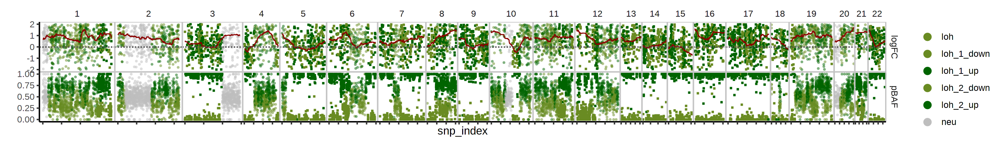

In [313]:
options(repr.plot.width = 14, repr.plot.height = 2, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

bulk_tumor %>% plot_psbulk(min_depth = 10)

In [314]:
segs_consensus = get_segs_consensus(bulk_tumor)

chroms = c(3, 5, 9, 13:17, 22)

haplo_truth = bulk_tumor %>%
    filter(CHROM %in% chroms & cnv_state == 'loh_2') %>%
    filter(!is.na(AD)) %>%
    mutate(haplo_truth = ifelse(AR < 0.5, 'minor', 'major')) %>%
    select(CHROM, snp_id, haplo_truth)

### Phasing statistics

In [544]:
bulk_phased %>% count(GT_truth)

GT_truth,n
<chr>,<int>
0|1,2185
1|0,2212


In [315]:
# assign contiguous correctly phased segments
assign_block = function(v) {c(0, cumsum(v[1:length(v)-1] != v[2:length(v)])) + 1}

bulk_phased = bulk_tumor %>% 
    mutate(BAF = AD/DP) %>%
    filter(CHROM %in% chroms & cnv_state == 'loh_2') %>%
    filter(!is.na(pAD)) %>%
    filter(!is.na(gene)) %>%
    rowwise() %>%
    mutate(p_binom = binom.test(x = AD, n = DP, p = 0.5)$p.value) %>%
    ungroup() %>%
    mutate(GT_truth = case_when(
        p_binom > 0.05 ~ 'unknown',
        BAF < 0.5 ~ '0|1',
        BAF >= 0.5 ~ '1|0'
    )) %>%
    filter(GT_truth != 'unknown') %>%
    group_by(CHROM) %>%
    mutate(
        config = GT_truth == GT,
        switch = c(0, config[2:length(config)] != config[1:(length(config)-1)]),
        phase_block = assign_block(config),
        phase_block = paste0(CHROM, '_', phase_block),
        p_s = switch_prob_cm(inter_snp_cm)
    ) %>%
    ungroup() 

D1 = bulk_phased %>% 
    group_by(phase_block, CHROM) %>%
    summarise(
        n_snps = n(),
        length = max(POS) - min(POS),
        n_genes = length(unique(gene)),
        .groups = 'drop'
    ) %>%
    ungroup()

In [316]:
bulk_phased %>%
group_by(CHROM, gene) %>%
filter(n() > 1) %>%
mutate(
    switch = c(NA, config[2:length(config)] != config[1:(length(config)-1)]),
    inter_snp_cm = c(NA, cM[2:length(cM)] - cM[1:(length(cM)-1)])
) %>%
ungroup() %>%
summarise(
    accuracy = 1-mean(na.omit(switch)),
    dist = mean(na.omit(inter_snp_cm))
) 

p_s,dist
<dbl>,<dbl>
0.9687796,0.01284985


In [317]:
bulk_phased %>%
group_by(CHROM, gene) %>%
filter(row_number() == 1 | row_number() == n()) %>%
group_by(CHROM) %>%
mutate(
    switch = c(NA, config[2:length(config)] != config[1:(length(config)-1)]),
    inter_snp_cm = c(NA, cM[2:length(cM)] - cM[1:(length(cM)-1)])
) %>%
group_by(CHROM, gene) %>%
filter(row_number() == 1) %>%
ungroup() %>%
summarise(
    accuracy = 1-mean(na.omit(switch)),
    dist = mean(na.omit(inter_snp_cm))
)

p_s,dist
<dbl>,<dbl>
0.7789647,0.9153425


Warning message:
“Ignoring unknown parameters: fill”


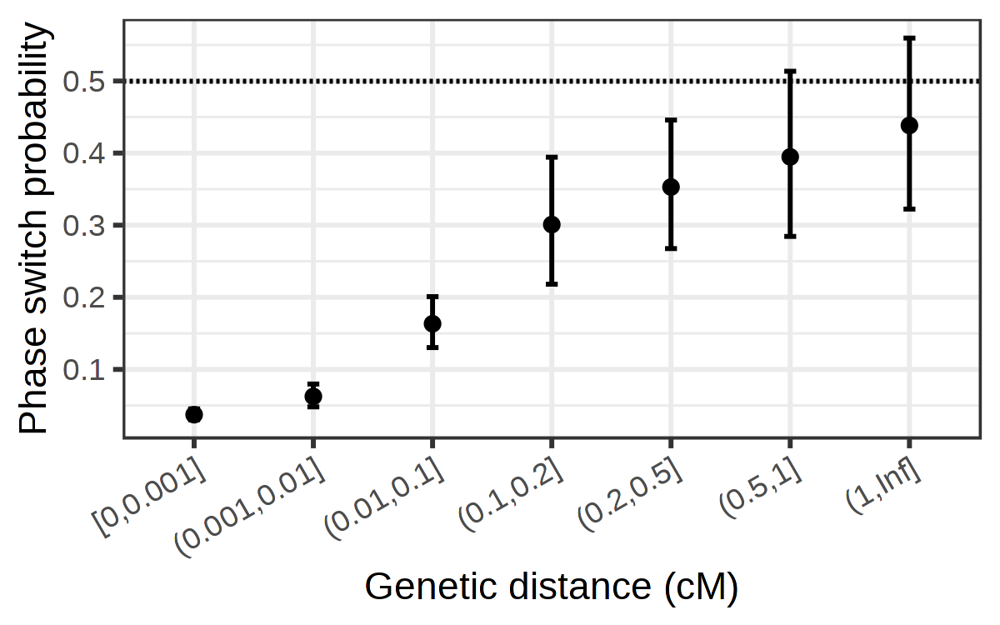

In [1189]:
options(repr.plot.width = 4, repr.plot.height = 2.5, repr.plot.res = 300)
R.utils::sourceDirectory('~/Numbat/R')

D = bulk_phased %>%
    filter(!is.na(inter_snp_cm)) %>%
    mutate(
        distance_bin = cut(
            inter_snp_cm,
            breaks = c(0, 1e-3, 1e-2, 0.1, 0.2, 0.5, 1, Inf),
#             breaks = c(0, 1e-5, 1e-4, 1e-3, 1e-2, 0.1, Inf),
            include.lowest = TRUE),
        p_s = switch_prob_cm(inter_snp_cm, lambda = 3)
    )

ggplot(
    D %>% group_by(distance_bin) %>%
    summarise(
        p_s = mean(switch),
        low = binom.test(x = sum(switch), n = n(), p = 0.5)$conf.int[1],
        high = binom.test(x = sum(switch), n = n(), p = 0.5)$conf.int[2],
    ),
    aes(x = distance_bin, y = p_s)
) +
# geom_boxplot(
#     data = D,
#     aes(color = 'predicted'),
#     alpha = 0.5,
#     notch=TRUE,
#     notchwidth = 0.8
# ) +
# geom_line(aes(group = 1), color = 'blue') +
geom_errorbar(aes(ymin = low, ymax = high), width = 0.1, fill = 'blue') +
geom_point() +
geom_hline(yintercept = 0.5, linetype = 'dashed') +
theme_bw() +
guides(color = guide_legend(title = '')) +
scale_color_manual(values = c('gray50', 'blue')) +
theme(axis.text.x = element_text(angle = 30, hjust = 1)) +
xlab('Genetic distance (cM)') +
ylab('Phase switch probability')
# ylim(0,0.5)

In [569]:
R.utils::sourceDirectory('~/Numbat/R')

bulk_phased %>%
    filter(!is.na(inter_snp_cm)) %>%
#     filter(inter_snp_cm > 0) %>%
    filter(CHROM == 13) %>%
    {fit_switch_prob(.$switch, .$inter_snp_cm)}

[1] 20.77879

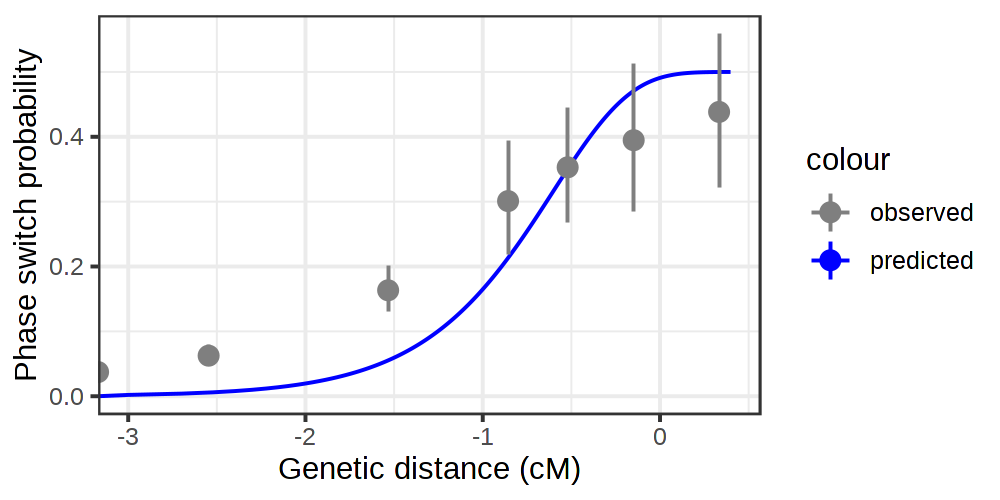

In [320]:
ggplot(
    data.frame(
        x = seq(0,2.5,0.001)
    ) %>%
    mutate(
        p_s = switch_prob_cm(x, lambda = 2)
    )
) +
geom_line(
    aes(x = log10(x), y = p_s, color = 'predicted')
) +
geom_pointrange(
    data = D %>% group_by(distance_bin) %>%
    summarise(
        p_s = mean(switch),
        inter_snp_cm = mean(log10(inter_snp_cm)),
        low = binom.test(x = sum(switch), n = n(), p = 0.5)$conf.int[1],
        high = binom.test(x = sum(switch), n = n(), p = 0.5)$conf.int[2],
    ),
    aes(x = inter_snp_cm, y = p_s, ymin = low, ymax = high, color = 'observed'),
) +
theme_bw() +
scale_color_manual(values = c('gray50', 'blue')) +
xlab('Genetic distance (cM)') +
ylab('Phase switch probability')

In [321]:
D1 %>% pull(n_genes) %>% summary

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   2.000   3.515   4.000  28.000 

In [44]:
D1 %>% pull(n_snps) %>% summary

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1.00    2.00    7.00   11.83   17.00   77.00 

Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“Removed 60437 rows containing missing values (geom_point).”


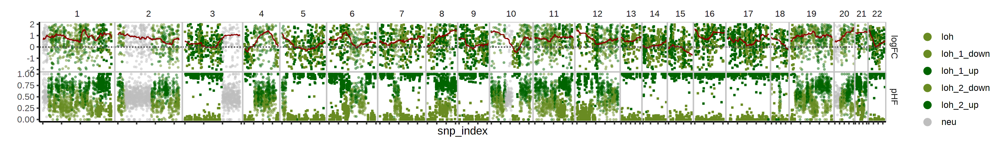

In [452]:
options(repr.plot.width = 14, repr.plot.height = 2, repr.plot.res = 200)

bulk_tumor %>% plot_psbulk(min_depth = 10)

In [561]:
bulk_phased %>% filter(inter_snp_cm == 0) %>% count(switch)

switch,n
<dbl>,<int>
0,855
1,28


In [602]:
bulk_tumor %>%
# filter(CHROM %in% chroms & cnv_state == 'loh_2') %>%
filter(CHROM == 21) %>%
select(pAD, DP, inter_snp_cm) %>%
filter(complete.cases(.)) %>%
{switch_prob_mle(.$pAD, .$DP, .$inter_snp_cm, theta = 0.08)}

5.123338


In [12]:
cells_normal = cell_annot[[sample]] %>% filter(annot == 'N') %>% pull(cell)

bulk_normal = get_bulk(
    count_mat = count_mat_obs[[sample]][,cells_normal],
    df = df[[sample]] %>% filter(cell %in% cells_normal),
    lambdas_ref = ref_set,
    gtf_transcript = gtf_transcript,
    genetic_map = genetic_map,
    min_depth = 0
) %>%
analyze_bulk_lnpois(t = 1e-8, diploid_chroms = c(14, 15), allele_only = T)

[1] "Retesting CNVs.."

Warning message in min(POS):
“no non-missing arguments to min; returning Inf”
Warning message in max(POS):
“no non-missing arguments to max; returning -Inf”


[1] "Finishing.."

Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“Removed 84817 rows containing missing values (geom_point).”


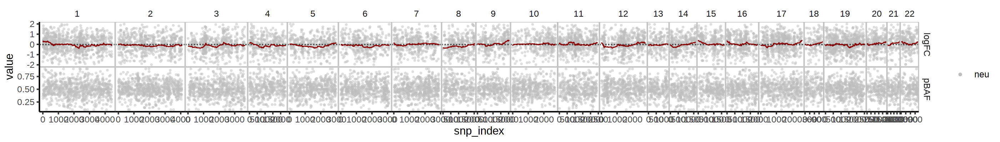

In [13]:
options(repr.plot.width = 14, repr.plot.height = 2, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

bulk_normal %>% plot_psbulk(min_depth = 10)

In [1055]:
saveRDS(scores, '~/results/benchmark/bulk_cnv_scores.rds')

In [1056]:
saveRDS(cell_res, '~/results/benchmark/cell_cnv_scores.rds')

In [1057]:
saveRDS(bulks_all, '~/results/benchmark/haplotype_bulks.rds')

In [1058]:
saveRDS(haplo_truth, '~/results/benchmark/haplotype_truth.rds')

In [691]:
set.seed(0)

nodes = list()

n_cells = 1150
ratios = seq(0, 1, 0.1)
seed = 1
panel = 'topmed'
for (r in ratios) {
    
        set.seed(seed)

        cells_tumor = cell_annot[[sample]] %>% 
            filter(annot == 'T') %>%
            pull(cell) %>% sample(n * r)

        cells_normal = cell_annot[[sample]] %>%
            filter(annot == 'N') %>% 
            pull(cell) %>% sample(n * (1-r))

        nodes[[as.character(r)]] = list(cells = c(cells_tumor, cells_normal), members = s, label = r, size = n)
    
}

In [692]:
bulks_serial = mclapply(
    nodes,
    mc.cores = 10,
    function(g) {

        bulk = get_allele_bulk(
            df = df[[panel]] %>% filter(cell %in% g$cells),
            genetic_map = genetic_map,
            min_depth = 0,
            lambda = lambda
        ) %>%
        mutate(
            n_cells = g$size,
            seed = g$members,
            ratio = g$label
        ) %>%
        annot_consensus(segs_consensus) %>%
        filter(CHROM %in% chroms & cnv_state == 'loh_2')

})

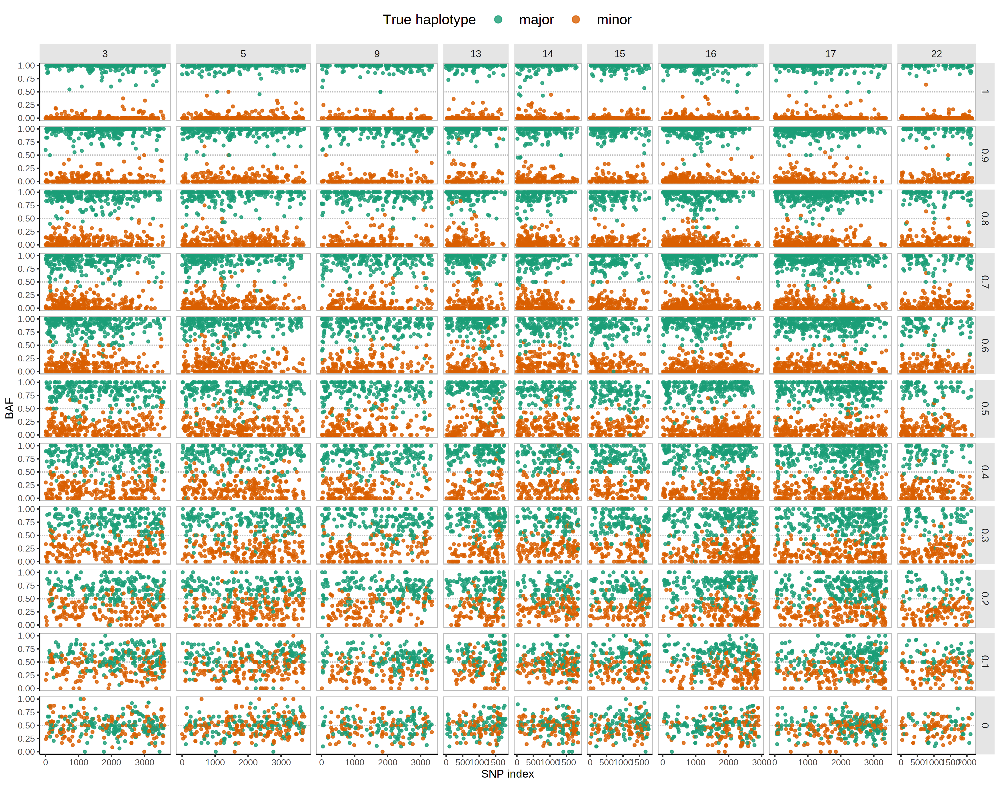

In [1179]:
options(repr.plot.width = 14, repr.plot.height = 11, repr.plot.res = 250)

bind_rows(bulks_serial) %>%
arrange(-ratio) %>%
mutate(ratio = factor(ratio, unique(ratio))) %>%
inner_join(haplo_truth, by = c('snp_id', 'CHROM')) %>%
filter(DP > 5) %>%
group_by(CHROM) %>%
arrange(CHROM, POS) %>%
mutate(snp_index = as.integer(factor(snp_index, unique(snp_index)))) %>%
ungroup() %>%
ggplot(
    aes(x = snp_index, y = AR, color = haplo_truth),
    na.rm=TRUE
) +
geom_hline(yintercept = 0.5, linetype = 'dashed', color = 'gray') +
geom_point(
    alpha = 0.8,
    size = 1
) +
theme_classic() +
theme(
    panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
    strip.background = element_rect(fill = 'gray90', size = 0),
    strip.text = element_text(size = 10),
    legend.position = 'top',
    legend.title = element_text(size=14),
    legend.text = element_text(size=14),
) +
scale_shape_manual(values = c(1,4)) +
scale_size_manual(values = c(1,3)) +
scale_color_manual(values = c(pal2[1], pal2[2])) +
guides(
    color = guide_legend(
        title = 'True haplotype',
        override.aes = aes(size = 3),
        keywidth = unit(1, 'cm')
    ),
    size = 'none'
) +
ylab('BAF') +
xlab('SNP index') +
facet_grid(ratio~CHROM, scale = 'free_x', space = 'free_x')

## Haplotype reconstruction

In [363]:
set.seed(0)

nodes = list()

n_cells = c(300, 500, 750, 1150)
ratios = seq(0, 1, 0.05)

for (n in n_cells) {
    for (r in ratios) {
        for (s in 1:5) {

            set.seed(s)

            cells_tumor = cell_annot[[sample]] %>% 
                filter(annot == 'T') %>%
                pull(cell) %>% sample(n * r)

            cells_normal = cell_annot[[sample]] %>%
                filter(annot == 'N') %>% 
                pull(cell) %>% sample(n * (1-r))

            nodes[[paste0(r, '_', s, '_', n)]] = list(cells = c(cells_tumor, cells_normal), members = s, label = r, size = n)
        }
    }
}

In [407]:
R.utils::sourceDirectory('~/Numbat/R')

panels = c('topmed', '1000G')
bulks_all = list()
chroms = c(3, 5, 9, 13:17, 22)
lambda = 1

for (panel in panels) {
    bulks_all[[panel]] = mclapply(
        nodes,
        mc.cores = 30,
        function(g) {
            
            bulk = get_allele_bulk(
                df = df[[panel]] %>% filter(cell %in% g$cells),
                genetic_map = genetic_map,
                min_depth = 0,
                lambda = lambda
            ) %>%
            mutate(
                n_cells = g$size,
                seed = g$members,
                ratio = g$label
            ) %>%
            annot_consensus(segs_consensus) %>%
            filter(CHROM %in% chroms & cnv_state == 'loh_2') %>%
            group_by(CHROM, seg) %>%
            mutate(
                approx_lik_ar(pAD, DP, p_s, gamma = 20, start = 0.1)
            ) %>%
            classify_alleles() %>%
            mutate(panel = panel)
            
    })
}

In [ ]:
bulks_all = readRDS('~/results/benchmark/haplotype_bulks.rds')

In [713]:
D = rbind(
        bind_rows(bulks_all[['1000G']]) %>% mutate(panel = '1000G'),
        bind_rows(bulks_all[['topmed']]) %>% mutate(panel = 'topmed')
    ) %>%
    inner_join(
        haplo_truth, by = c("snp_id", "CHROM")
    )

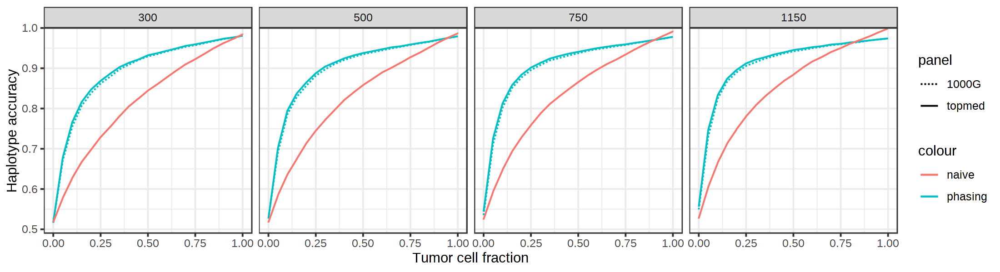

In [327]:
options(repr.plot.width = 11, repr.plot.height = 3, repr.plot.res = 200)
# lambda = 2
D %>%
group_by(ratio, panel, n_cells) %>%
summarise(
    naive_error = mean(haplo_naive != haplo_truth, na.rm = T),
    bw_error = mean(haplo_post != haplo_truth, na.rm = T),
    .groups = 'drop'
) %>%
ggplot() +
geom_line(aes(x = ratio, y = 1-bw_error, color = 'phasing', linetype = panel)) +
geom_line(aes(x = ratio, y = 1-naive_error, color = 'naive')) +
theme_bw() +
ylab('Haplotype accuracy') +
xlab('Tumor cell fraction') +
scale_linetype_manual(values = c('dashed', 'solid')) +
scale_y_continuous(expand = expansion(add = 0), limits = c(0.49, 1)) +
facet_wrap(~n_cells, nrow = 1)

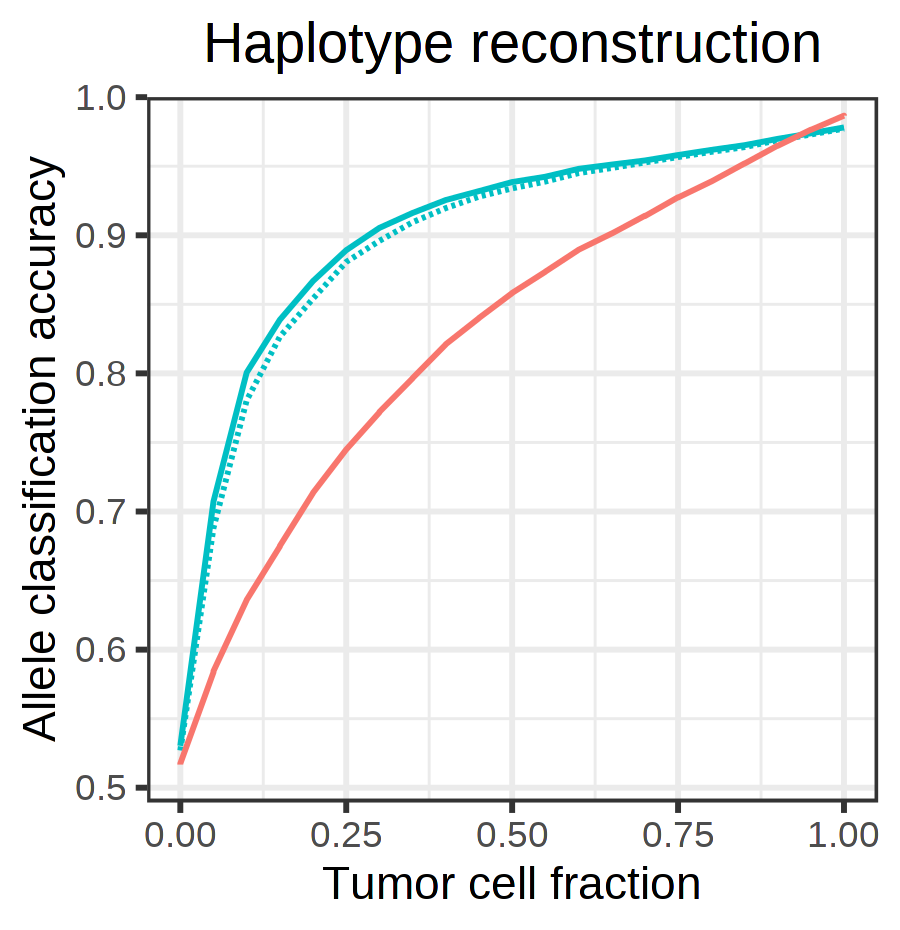

In [719]:
options(repr.plot.width = 3, repr.plot.height = 3.1, repr.plot.res = 300)
# lambda = 2
D %>%
filter(n_cells == 500) %>%
group_by(ratio, panel, n_cells) %>%
summarise(
    naive_error = mean(haplo_naive != haplo_truth, na.rm = T),
    bw_error = mean(haplo_post != haplo_truth, na.rm = T),
    .groups = 'drop'
) %>%
ggplot() +
geom_line(aes(x = ratio, y = 1-bw_error, color = 'phasing', linetype = panel)) +
geom_line(aes(x = ratio, y = 1-naive_error, color = 'naive')) +
theme_bw() +
ylab('Allele classification accuracy') +
xlab('Tumor cell fraction') +
scale_linetype_manual(values = c('dashed', 'solid')) +
scale_y_continuous(expand = expansion(add = 0), limits = c(0.49, 1)) +
theme(
    plot.title = element_text(hjust = 0.5),
    legend.position = 'none'
) +
ggtitle('Haplotype reconstruction')

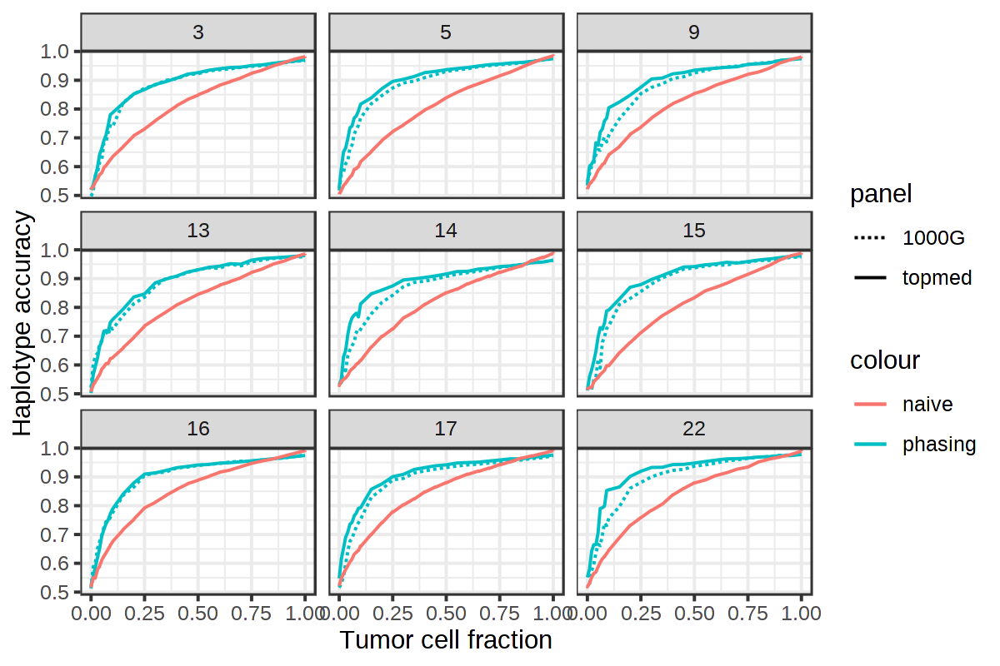

In [1140]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)

D %>%
group_by(ratio, CHROM, panel) %>%
summarise(
    naive_error = mean(haplo_naive != haplo_truth, na.rm = T),
    hmm_error = mean(haplo_post != haplo_truth, na.rm = T),
    .groups = 'drop'
) %>%
ggplot() +
geom_line(aes(x = ratio, y = 1-hmm_error, color = 'phasing', linetype = panel)) +
geom_line(aes(x = ratio, y = 1-naive_error, color = 'naive')) +
theme_bw() +
facet_wrap(~CHROM) +
ylab('Haplotype accuracy') +
xlab('Tumor cell fraction') +
scale_linetype_manual(values = c('dashed', 'solid')) +
scale_y_continuous(expand = expansion(add = 0), limits = c(0.49, 1))

In [375]:
bulks_all = readRDS('~/results/benchmark/haplotype_bulks.rds')

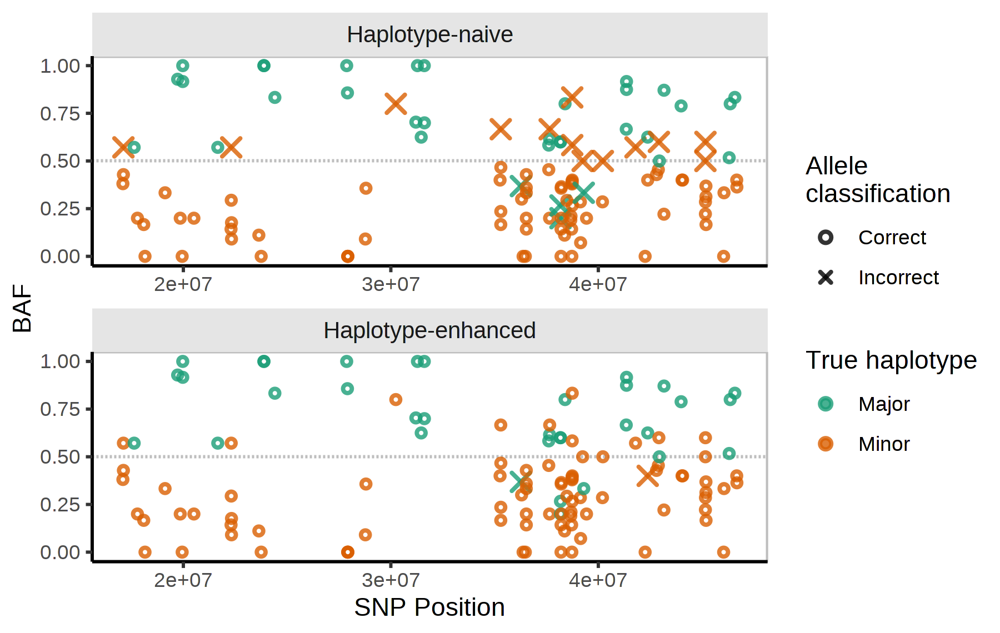

In [1173]:
options(repr.plot.width = 6, repr.plot.height = 3.8, repr.plot.res = 300)

pal2 = RColorBrewer::brewer.pal(n = 8, 'Dark2')

D_haplo = bulks_all[['topmed']][['0.2_1_500']] %>%
    annot_consensus(segs_consensus) %>%
    filter(cnv_state == 'loh_2') %>%
    filter(CHROM == 22 & snp_index < 21840) %>%
    filter(DP >= 5) %>%
    mutate(snp_index = 1:n()) %>%
    left_join(haplo_truth, by = c('snp_id', 'CHROM')) %>%
    filter(!is.na(haplo_truth)) %>%
    mutate(phasing = haplo_post == haplo_truth) %>%
    mutate(naive = haplo_naive == haplo_truth) %>%
    reshape2::melt(measure.vars = c('phasing', 'naive'), variable.name = 'method') %>%
    mutate(method = factor(method, c('naive', 'phasing'))) %>%
    mutate(value = ifelse(value, 'Correct', 'Incorrect')) %>%
    mutate(haplo_truth = ifelse(haplo_truth == 'major', 'Major', 'Minor')) %>%
    mutate(CHROM = paste0('chr', CHROM)) %>%
    mutate(var_y = ifelse(method == 'naive', AR, 1-pBAF))

ggplot(
    D_haplo %>% 
        mutate(method = c('naive' = 'Haplotype-naive', 'phasing' = 'Haplotype-enhanced')[method]) %>%
        mutate(method = factor(method, unique(rev(method)))),
    aes(x = POS, y = AR, pch = value, color = haplo_truth, size = value),
    na.rm=TRUE
) +
geom_hline(yintercept = 0.5, linetype = 'dashed', color = 'gray') +
geom_point(
    alpha = 0.8,
    stroke = 1
) +
theme_classic() +
theme(
    panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
    strip.background = element_rect(fill = 'gray90', size = 0),
    strip.text = element_text(size = 10),
    legend.position = 'right'
) +
facet_wrap(~method, scale = 'free', ncol = 1) +
scale_shape_manual(values = c(1,4)) +
scale_size_manual(values = c(1,3)) +
scale_color_manual(values = c(pal2[1], pal2[2])) +
guides(
    color = guide_legend(title = 'True haplotype'),
    shape = guide_legend(title = 'Allele\nclassification'),
    size = 'none'
) +
ylab('BAF') +
xlab('SNP Position')

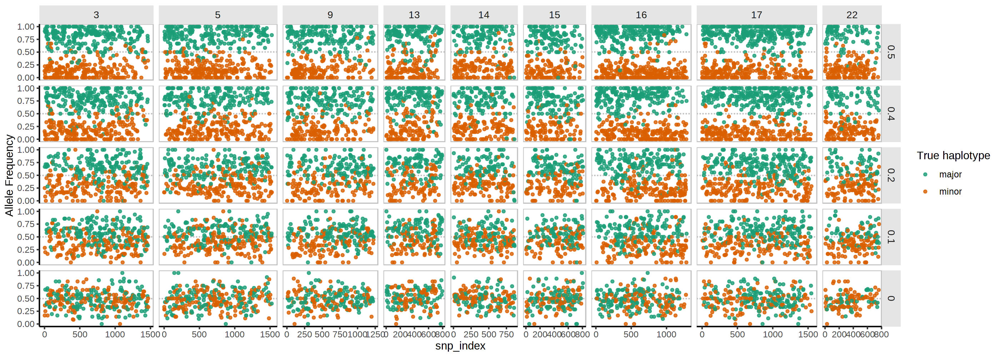

In [681]:
options(repr.plot.width = 14, repr.plot.height = 5, repr.plot.res = 200)

bind_rows(bulks_all[['topmed']])%>%

filter(seed == 1) %>% 
filter(ratio %in% c(0, 0.1, 0.2, 0.3, 0.4, 0.5)) %>%
arrange(-ratio) %>%
mutate(ratio = factor(ratio, unique(ratio))) %>%
inner_join(haplo_truth, by = c('snp_id', 'CHROM')) %>%
filter(DP > 5) %>%
group_by(CHROM) %>%
arrange(CHROM, POS) %>%
mutate(snp_index = as.integer(factor(snp_index, unique(snp_index)))) %>%
ungroup() %>%
ggplot(
    aes(x = snp_index, y = AR, color = haplo_truth),
    na.rm=TRUE
) +
geom_hline(yintercept = 0.5, linetype = 'dashed', color = 'gray') +
geom_point(
    alpha = 0.8,
    size = 1
) +
theme_classic() +
theme(
    panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
    strip.background = element_rect(fill = 'gray90', size = 0),
    strip.text = element_text(size = 10),
    legend.position = 'right'
) +
scale_shape_manual(values = c(1,4)) +
scale_size_manual(values = c(1,3)) +
scale_color_manual(values = c(pal2[1], pal2[2])) +
guides(
    color = guide_legend(title = 'True haplotype'),
    shape = guide_legend(title = 'Haplotype\nClassification'),
    size = 'none'
) +
ylab('Allele Frequency') +
facet_grid(ratio~CHROM, scale = 'free_x', space = 'free_x')

## single-cell CNV evaluation

In [329]:
sample = 'TNBC4'
out_dir = glue('~/results/tvn/{sample}')
clone_post = fread(glue('{out_dir}/clone_post_1.tsv'))
allele_post = fread(glue('{out_dir}/allele_post_2.tsv'))

cells_exclude = allele_post %>% 
    left_join(cell_annot[[sample]], by = 'cell') %>%
    filter(seg == '14_1') %>%
    filter(annot == 'N' & p_cnv > 0.999) %>%
    pull(cell)

In [416]:
set.seed(0)

nodes = list()
cells_train = cell_annot[[sample]] %>% filter(!cell %in% cells_exclude) %>% sample_frac(0.7) %>% pull(cell)
cells_test = cell_annot[[sample]] %>% filter(!cell %in% cells_exclude) %>% filter(!cell %in% cells_train) %>% pull(cell)

n_cells = 750
ratios = c(seq(0, 0.1, 0.01), seq(0.15, 0.5, 0.05))

for (n in n_cells) {
    for (r in ratios) {
        for (s in 1:5) {

            set.seed(s)

            cells_tumor = cell_annot[[sample]] %>% 
                filter(annot == 'T' & cell %in% cells_train) %>%
                pull(cell) %>% sample(n * r)

            cells_normal = cell_annot[[sample]] %>%
                filter(annot == 'N' & cell %in% cells_train) %>% 
                pull(cell) %>% sample(n * (1-r))

            nodes[[paste0(r, '_', s, '_', n)]] = list(cells = c(cells_tumor, cells_normal), members = s, label = r, size = n)
        }
    }
}

In [417]:
R.utils::sourceDirectory('~/Numbat/R')

panels = c('topmed', '1000G')
bulks_all = list()
chroms = c(3, 5, 9, 13:17, 22)
lambda = 1

for (panel in panels) {
    display(panel)
    bulks_all[[panel]] = mclapply(
        nodes,
        mc.cores = 45,
        function(g) {

            bulk = get_allele_bulk(
                df = df[[panel]] %>% filter(cell %in% g$cells),
                genetic_map = genetic_map,
                min_depth = 0,
                lambda = lambda
            ) %>%
            mutate(
                n_cells = g$size,
                seed = g$members,
                ratio = g$label
            ) %>%
            annot_consensus(segs_consensus) %>%
            filter(CHROM %in% chroms & cnv_state == 'loh_2') %>%
            group_by(CHROM, seg) %>%
            mutate(
                approx_lik_ar(pAD, DP, p_s, gamma = 20, start = 0.1)
            ) %>%
            classify_alleles() %>%
            ungroup() %>%
            mutate(panel = panel, lambda = lambda)

    })    
}

[1] "topmed"

[1] "1000G"

In [418]:
R.utils::sourceDirectory('~/Numbat/R')

cell_res = list()

for (panel in panels) {
    display(panel)
    cell_res[[panel]] = mclapply(
        bulks_all[[panel]],
        mc.cores = 45,
        function(bulk) {
            
            bulk = bulk %>%
                annot_consensus(segs_consensus) %>%
                filter(CHROM %in% chroms)

            allele_post_naive = get_allele_post(
                bulk,
                segs_consensus %>% mutate(seg = seg_cons),
                df[[panel]] %>% filter(cell %in% cells_test),
                naive = TRUE
            )

            allele_post_phasing = get_allele_post(
                bulk,
                segs_consensus %>% mutate(seg = seg_cons),
                df[[panel]] %>% filter(cell %in% cells_test),
                naive = FALSE
            )

            allele_post = rbind(
                allele_post_naive %>% mutate(method = 'naive'),
                allele_post_phasing %>% mutate(method = 'phasing')
            ) %>%
            mutate(
                seed = unique(bulk$seed),
                ratio = unique(bulk$ratio)
            ) %>%
            mutate(panel = panel)

            return(allele_post)

    })
}

[1] "topmed"

[1] "1000G"

In [333]:
D = rbind(
        bind_rows(bulks_all[['1000G']]) %>% mutate(panel = '1000G'),
        bind_rows(bulks_all[['topmed']]) %>% mutate(panel = 'topmed')
    ) %>%
    inner_join(
        haplo_truth, by = c("snp_id", "CHROM")
    )

Warning message:
“Removed 16 row(s) containing missing values (geom_path).”
Warning message:
“Removed 16 row(s) containing missing values (geom_path).”
Warning message:
“Removed 144 rows containing missing values (geom_point).”


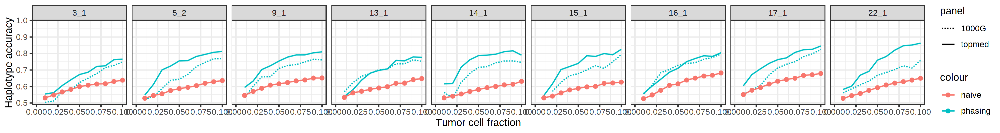

In [418]:
options(repr.plot.width = 15, repr.plot.height = 2, repr.plot.res = 200)

D %>%
filter(ratio > 0) %>%
group_by(ratio, panel, seg, n_cells) %>%
summarise(
    naive_error = mean(haplo_naive != haplo_truth, na.rm = T),
    bw_error = mean(haplo_post != haplo_truth, na.rm = T),
    viterbi_error = mean(haplo_mpc != haplo_truth, na.rm = T),
    .groups = 'drop'
) %>%
ggplot() +
geom_line(aes(x = ratio, y = 1-bw_error, color = 'phasing', linetype = panel)) +
geom_line(aes(x = ratio, y = 1-naive_error, color = 'naive')) +
geom_point(aes(x = ratio, y = 1-naive_error, color = 'naive')) +
theme_bw() +
ylab('Haplotype accuracy') +
xlab('Tumor cell fraction') +
scale_linetype_manual(values = c('dashed', 'solid')) +
scale_y_continuous(expand = expansion(add = 0), limits = c(0.49, 1)) +
facet_wrap(~seg, nrow = 1) +
xlim(0,0.1)

### Averaged across events

In [444]:
D_sc = bind_rows(
        bind_rows(cell_res[['topmed']]) %>% mutate(panel = 'topmed'),
        bind_rows(cell_res[['1000G']]) %>% mutate(panel = '1000G')
    ) %>%
    inner_join(cell_annot[[sample]], by = 'cell') %>%
    filter(total >= 3) %>%
    mutate(
        y = as.integer(annot == 'T'),
        y_hat = as.integer(p_cnv > 0.9)
    ) %>%
    group_by(ratio, method, panel) %>%
    summarise(
        precision = mean(y[y_hat == 1]),
        recall = mean(y_hat[y == 1]),
        auc = as.numeric(pROC::auc(y, logBF, direction = '<', levels = levels(as.factor(y)))),
        .groups = 'drop'
    )

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Warning message:
“Removed 12 row(s) containing missing values (geom_path).”
Warning message:
“Removed 12 row(s) containing missing values (geom_path).”


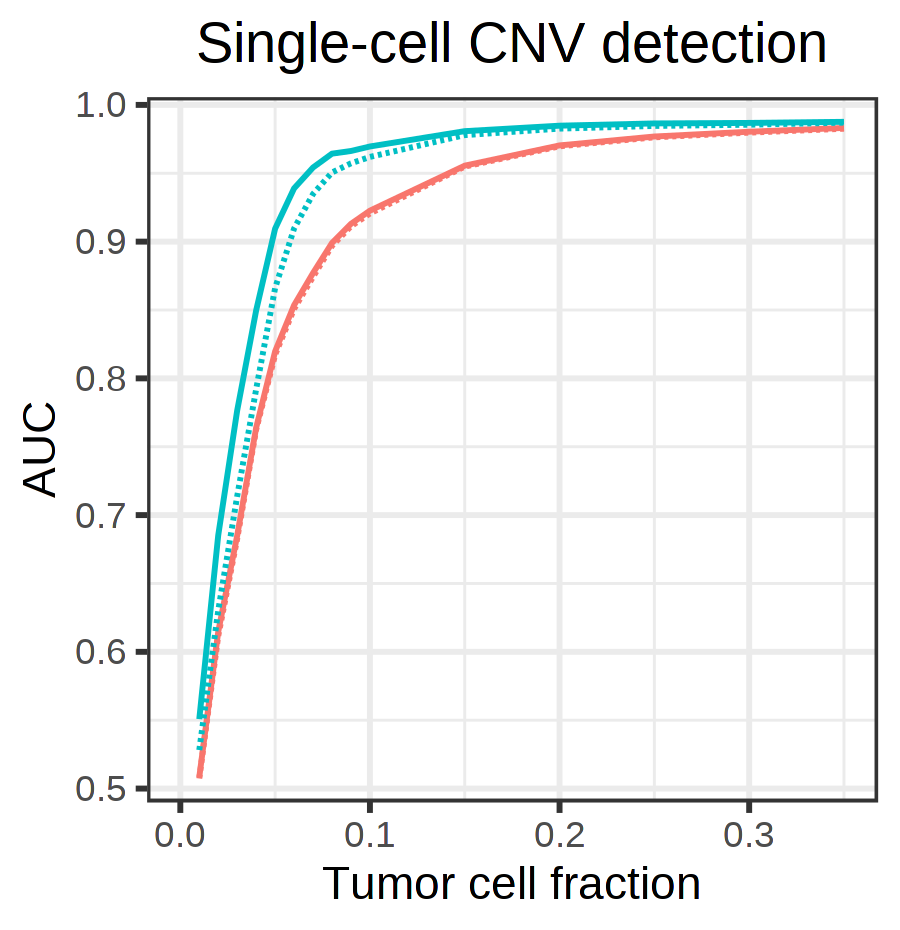

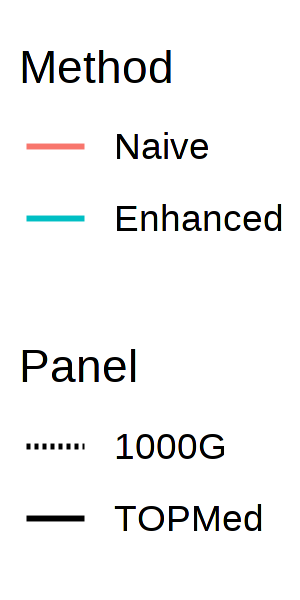

In [1152]:
options(repr.plot.width = 3, repr.plot.height = 3.1, repr.plot.res = 300)
# lambda = 2
p = D_sc %>%
    filter(ratio > 0) %>%
    mutate(method_label = c('naive' = 'Naive', 'phasing' = 'Enhanced')[method]) %>%
    mutate(method_label = factor(method_label, unique(method_label))) %>%
    mutate(panel = ifelse(panel == 'topmed', 'TOPMed', '1000G')) %>%
    ggplot(
        aes(x = ratio, y = auc, color = method_label, linetype = panel)
    ) +
    theme_bw() +
    scale_linetype_manual(values = c('dashed', 'solid')) +
    geom_line() +
    xlim(0, 0.35) +
    xlab('Tumor cell fraction') +
    ylab('AUC') +
    theme(
        plot.title = element_text(hjust = 0.5)
    ) +
    ggtitle('Single-cell CNV detection') +
    ylim(0.5, 1) +
    scale_y_continuous(expand = expansion(mult = 0.035)) +
    guides(
        color = guide_legend(title = 'Method'),
        linetype = guide_legend(title = 'Panel')
    )

p + theme(legend.position = 'none')

options(repr.plot.width = 1, repr.plot.height = 2, repr.plot.res = 300)

as_ggplot(get_legend(p))

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Warning message:
“Removed 12 row(s) containing missing values (geom_path).”


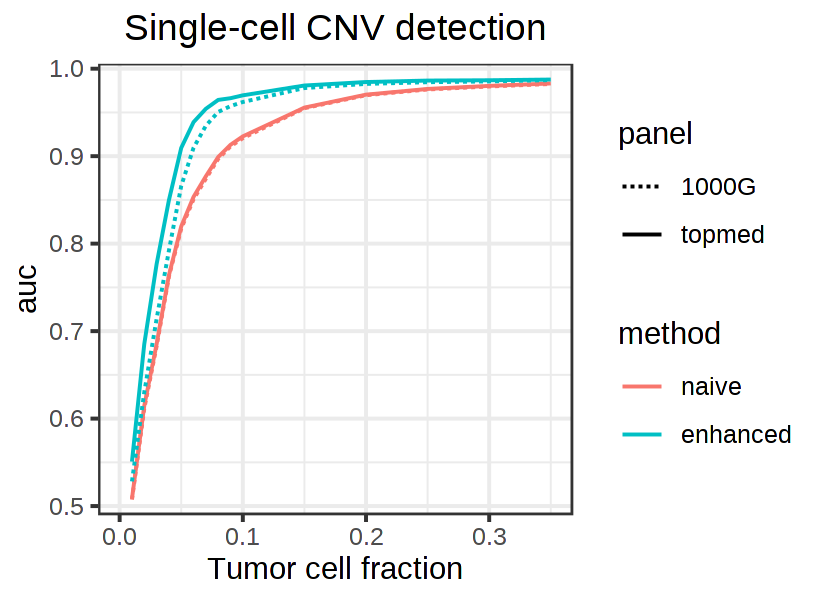

In [445]:
options(repr.plot.width = 4.1, repr.plot.height = 3, repr.plot.res = 200)
# lambda = 1
D_sc %>%
filter(ratio > 0) %>%
mutate(method_label = c('naive' = 'naive', 'phasing' = 'enhanced')[method]) %>%
mutate(method_label = factor(method_label, unique(method_label))) %>%
ggplot(
    aes(x = ratio, y = auc, color = method_label, linetype = panel)
) +
theme_bw() +
scale_linetype_manual(values = c('dashed', 'solid')) +
geom_line() +
xlim(0, 0.35) +
xlab('Tumor cell fraction') +
theme(
    plot.title = element_text(hjust = 0.5)
) +
ggtitle('Single-cell CNV detection') +
ylim(0.5, 1) +
scale_y_continuous(expand = expansion(mult = 0.035)) +
guides(color = guide_legend(title = 'method'))
# facet_wrap(~variable, scale = 'free_y')

In [385]:
cell_res = readRDS('~/results/benchmark/cell_cnv_scores.rds')

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



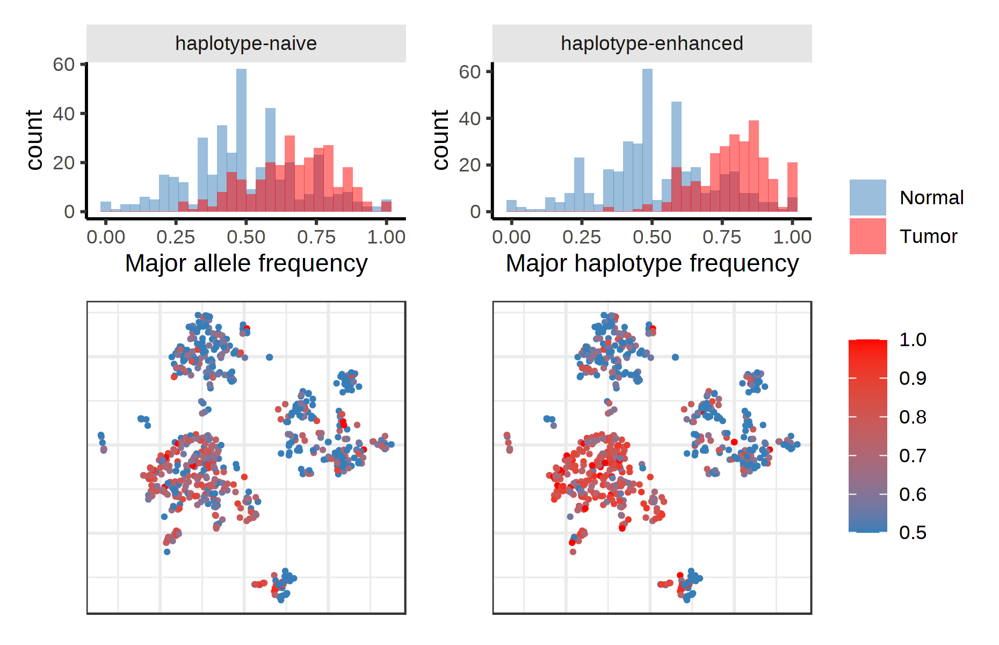

In [1154]:
options(repr.plot.width = 6.2, repr.plot.height = 4, repr.plot.res = 300)

D = cell_res[['topmed']][['0.03_1_750']] %>% 
    left_join(cell_annot[[sample]], by = 'cell') %>%
    filter(seg == '14_1') %>%
    filter(total >= 4) %>%
    mutate(annot = c('T' = 'Tumor', 'N' = 'Normal')[annot]) %>%
    mutate(method_label = c('naive' = 'haplotype-naive', 'phasing' = 'haplotype-enhanced')[method]) %>%
    mutate(method_label = factor(method_label, unique(rev(method_label))))

density_naive = D %>% 
    filter(method == 'naive') %>%
    ggplot(
        aes(x = MAF, fill = annot)
    ) +
    geom_histogram(alpha = 0.5, position = position_identity()) +
    theme_classic() +
    facet_wrap(~method_label) +
    guides(fill = 'none') +
    scale_fill_manual(values = c(pal[2], 'red')) +
    xlab('Major allele frequency') +
    theme(
        strip.background = element_rect(fill = 'gray90', size = 0)
    )

density_phasing = D %>% 
    filter(method == 'phasing') %>%
    ggplot(
        aes(x = MAF, fill = annot)
    ) +
    geom_histogram(alpha = 0.5, position = position_identity()) +
    theme_classic() +
    facet_wrap(~method_label) +
    guides(fill = guide_legend(title = '')) +
    scale_fill_manual(values = c(pal[2], 'red')) +
    xlab('Major haplotype frequency') +
    theme(
        strip.background = element_rect(fill = 'gray90', size = 0)
    )

cells_naive = con_TNBC$samples[['TNBC4']]$plotEmbedding(
    size = 0.5,
    alpha = 1,
    colors = D %>% filter(method == 'naive') %>%
        {setNames(.$MAF, .$cell)},
    plot.na = F,
    show.legend = F,
    plot.theme = theme_bw()
) +
scale_color_gradient(low = pal[2], high =  'red', limits = c(0.5, 1), oob = scales::oob_squish) +
guides(color = guide_colorbar(title = 'MAF', barwidth = 0.5, barheight = 4))

cells_phasing = con_TNBC$samples[['TNBC4']]$plotEmbedding(
    size = 0.5,
    alpha = 1,
    colors = D %>% filter(method == 'phasing') %>%
        {setNames(.$MAF, .$cell)},
    plot.na = F,
    show.legend = T,
    plot.theme = theme_bw()
) +
scale_color_gradient(low = pal[2], high =  'red', limits = c(0.5, 1), oob = scales::oob_squish) +
guides(color = guide_colorbar(title = ''))

(
    (density_naive / cells_naive) + plot_layout(heights = c(1,2)) | 
    (density_phasing / cells_phasing) + plot_layout(heights = c(1,2))
) +
plot_layout(guides = 'collect')

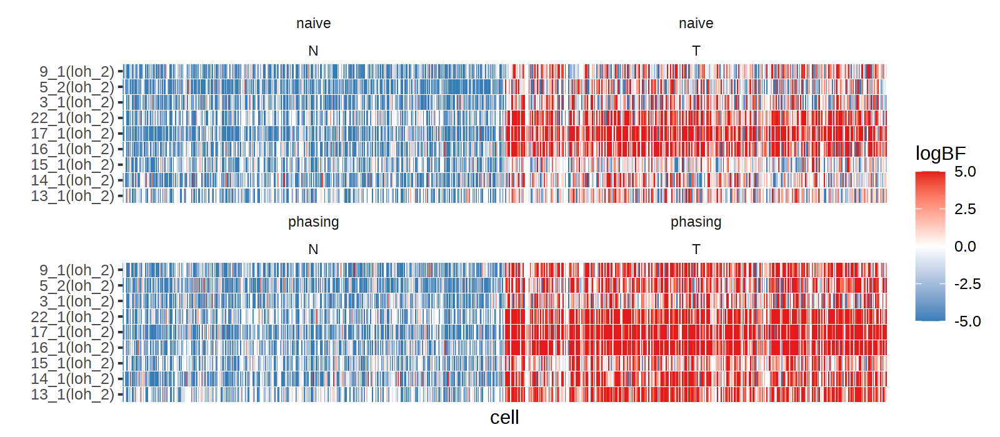

In [652]:
options(repr.plot.width = 8, repr.plot.height = 3.5, repr.plot.res = 200)

cell_res[['topmed']][['0.05_1_750']] %>% 
left_join(cell_annot[[sample]], by = 'cell') %>%
filter(total >= 3) %>%
cell_heatmap() +
facet_wrap(method~annot, scale = 'free_x') +
theme(strip.text = element_text(angle = 0))

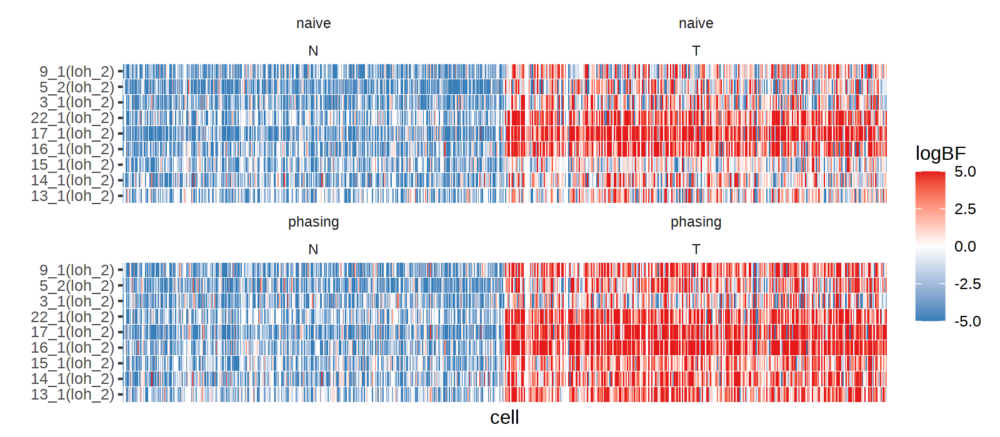

In [654]:
options(repr.plot.width = 8, repr.plot.height = 3.5, repr.plot.res = 200)

cell_res[['1000G']][['0.05_1_750']] %>% 
left_join(cell_annot[[sample]], by = 'cell') %>%
filter(total >= 3) %>%
cell_heatmap() +
facet_wrap(method~annot, scale = 'free_x') +
theme(strip.text = element_text(angle = 0))

### Per event

In [393]:
D = bind_rows(
        bind_rows(cell_res[['topmed']]) %>% mutate(panel = 'topmed'),
        bind_rows(cell_res[['1000G']]) %>% mutate(panel = '1000G')
    ) %>%
    left_join(cell_annot[[sample]], by = 'cell') %>%
    filter(total >= 3) %>%
    mutate(
        y = as.integer(annot == 'T'),
        y_hat = as.integer(p_cnv > 0.9)
    ) %>%
    group_by(ratio, method, seg, panel) %>%
    summarise(
        precision = mean(y[y_hat == 1]),
        recall = mean(y_hat[y == 1]),
        auc = as.numeric(pROC::auc(y, logBF, direction = '<', levels = levels(as.factor(y)))),
        .groups = 'drop'
    ) 

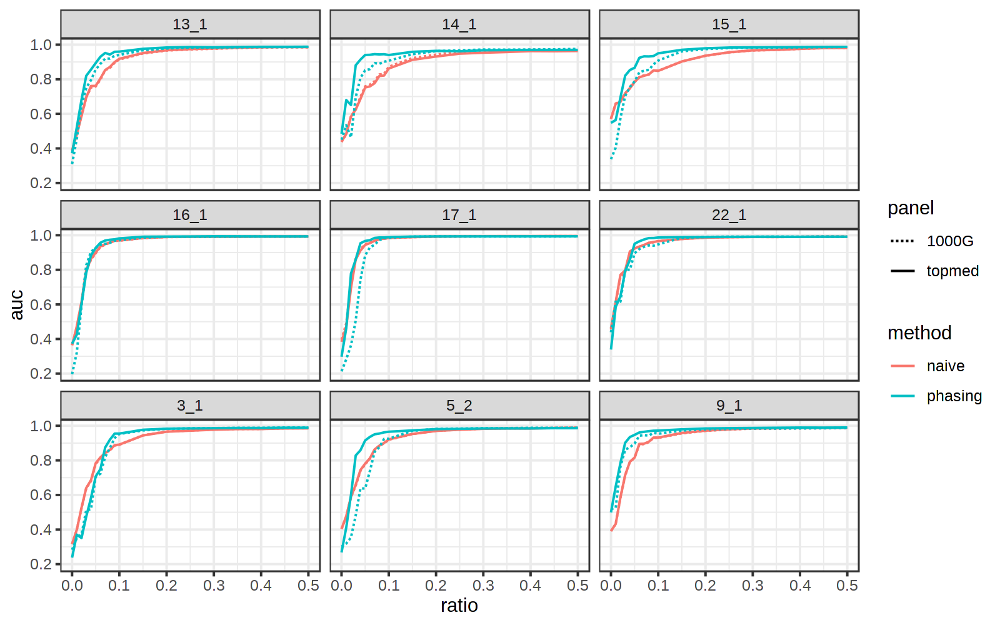

In [394]:
options(repr.plot.width = 8, repr.plot.height = 5, repr.plot.res = 200)

D %>%
ggplot(
    aes(x = ratio, color = method, linetype = panel)
) +
geom_line(
    aes(y = auc)
) +
theme_bw() +
scale_linetype_manual(values = c('dashed', 'solid')) +
facet_wrap(~seg, scale = 'fixed') +
xlim(0, 0.5)

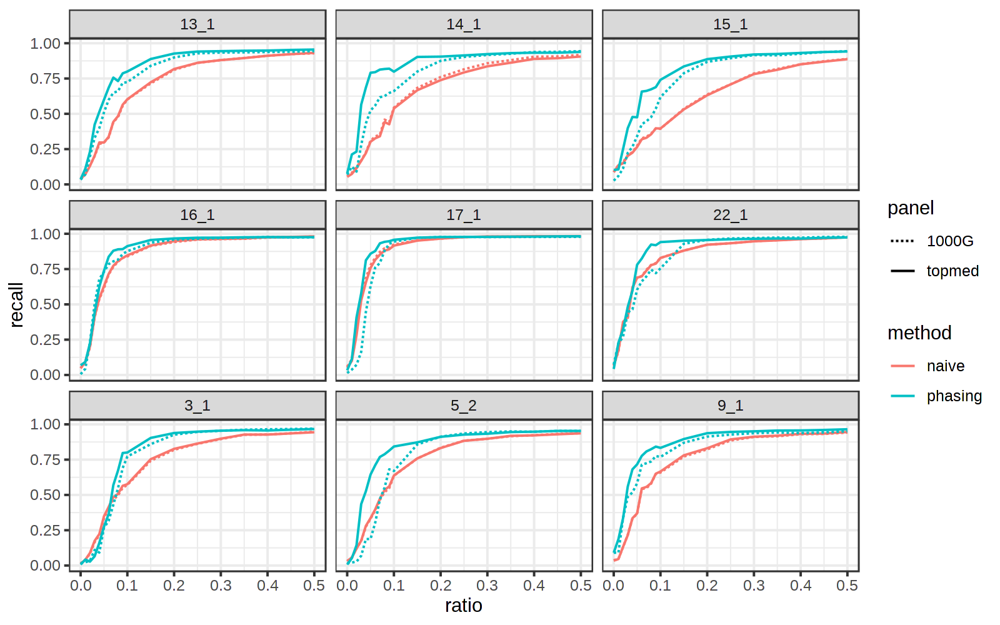

In [331]:
options(repr.plot.width = 8, repr.plot.height = 5, repr.plot.res = 200)

D %>%
ggplot(
    aes(x = ratio, color = method, linetype = panel)
) +
geom_line(
    aes(y = recall)
) +
theme_bw() +
scale_linetype_manual(values = c('dashed', 'solid')) +
facet_wrap(~seg, scale = 'fixed') +
xlim(0, 0.5)

## Event calling

In [336]:
sample = 'TNBC4'
out_dir = glue('~/results/tvn/{sample}')
clone_post = fread(glue('{out_dir}/clone_post_1.tsv'))
allele_post = fread(glue('{out_dir}/allele_post_2.tsv'))

cells_exclude = allele_post %>% 
    left_join(cell_annot[[sample]], by = 'cell') %>%
    filter(seg == '14_1') %>%
    filter(annot == 'N' & p_cnv > 0.999) %>%
    pull(cell)

In [446]:
set.seed(0)

nodes = list()

n_cells = 1150

ratios = seq(0, 0.15, 0.01)

for (r in ratios) {
    
    for (s in 1:5) {
        
        set.seed(s)
        
        cells_tumor = cell_annot[[sample]] %>% 
            filter(annot == 'T') %>%
            pull(cell) %>% sample(n_cells * r)
    
        cells_normal = cell_annot[[sample]] %>%
            filter(annot == 'N' & (!cell %in% cells_exclude)) %>% 
            pull(cell) %>% sample(n_cells * (1-r))

        nodes[[paste0(r, '_', s)]] = list(cells = c(cells_tumor, cells_normal), members = s, label = r, n_cells = n_cells)
    }
}

In [447]:
R.utils::sourceDirectory('~/Numbat/R')

diploid_chroms = c(14,15)
panels = c('topmed', '1000G')
bulks_event = list()
lambda = 1

# pseudobulks with different tumor fractions
for (panel in panels) {
    bulks_event[[panel]] = mclapply(
        nodes,
        mc.cores = 30,
        function(g) {
            get_bulk(
                count_mat = count_mat_obs[[sample]][,g$cells],
                df = df[[panel]] %>% filter(cell %in% g$cells),
                lambdas_ref = ref_set,
                gtf_transcript = gtf_transcript,
                genetic_map = genetic_map,
                min_depth = 0,
                lambda = lambda
            ) %>%
            mutate(
                n_cells = g$size,
                seed = g$members,
                ratio = g$label
            )
    })
}

In [355]:
theta_mle_naive = function(MAD, DP, lower = 0.0001, upper = 0.4999, start = 0.25, gamma = 20) {

    fit = optim(
        start, 
        function(theta) {-l_bbinom(MAD, DP, gamma*(0.5+theta), gamma*(0.5-theta))},
        method = 'L-BFGS-B',
        lower = lower,
        upper = upper,
        hessian = TRUE
    )
    
    mu = fit$par
    sigma = sqrt(as.numeric(1/(fit$hessian)))

    if (is.na(sigma)) {
        sigma = 0
    }
    
    return(tibble('theta_mle' = mu, 'theta_sigma' = sigma))
}

# get random segments from the profile
sample_segs = function(bulk, l = 500, n = 10) {
    
    starts = sample(1:(nrow(bulk)-l), n)
    
    bulk_segs = lapply(
        1:length(starts),
        function(i) {
            start = starts[i]
            bulk[start:(start+l),] %>% mutate(start_random = start, end_random = start+l, id_random = i)
        }
    ) %>%
    bind_rows()
    
    return(bulk_segs)
    
}

In [448]:
ls = c(100, 250, 500, 750)
# ls = c(500)

set.seed(0)
segs = list()

# different phasing panels
for (panel in panels) {
    # different cell mixtures
    segs[[panel]] = mclapply(
        mc.cores = 30,
        bulks_event[[panel]],
        function(bulk) {
            # different chroms                        
            lapply(
                chroms,
                function(chr) {
                    # different segment lengths
                    lapply(
                        ls,
                        function(l) {
                            
                            segs_mixture = bulk %>%
                                annot_consensus(segs_consensus) %>%
                                filter(CHROM == chr) %>%
                                filter(cnv_state == 'loh_2') %>%
                                filter(!is.na(AD)) %>% 
                                sample_segs(n = 10, l = l)

                            segs_normal = bulks_event[[panel]][[paste0('0_', unique(bulk$seed))]] %>%
                                filter(CHROM == chr) %>% 
                                sample_segs(n = 10, l = l) %>%
                                mutate(
                                    ratio = unique(bulk$ratio)
                                )

                            segs = bind_rows(
                                    segs_mixture %>% mutate(label = 1),
                                    segs_normal %>% mutate(label = 0)
                                ) %>%
                                mutate(MAD = ifelse(AD >= DP - AD, AD, DP-AD)) %>%
                                filter(!is.na(AD))

                            segs = segs %>% mutate(chr = chr, l = l)
                            
                            return(segs)
                            
                        }
                    ) %>% 
                    bind_rows()
                }
            ) %>% 
            bind_rows()
        }
    ) %>%
    bind_rows()
}

In [449]:
R.utils::sourceDirectory('~/Numbat/R')

scores = list()

gamma = 20

for (panel in panels) {
    
    display(panel)
    
    theta_neu = segs[[panel]] %>% filter(ratio == 0 & id_random == 1) %>%
        group_by(id_random, ratio, seed, chr, l, label) %>%
        summarise(
            theta_mle_naive(MAD, DP),
            .groups = 'drop'
        ) %>%
        pull(theta_mle) %>%
        mean

    scores[[panel]] = segs[[panel]] %>%
        split(list(.$id_random, .$chr, .$seed)) %>%
        mclapply(
            mc.cores = 45,
            function(bulk_seg) {
                
                scores_phasing = bulk_seg %>% 
                    group_by(id_random, ratio, seed, chr, l, label) %>%
                    summarise(
                        approx_lik_ar(pAD, DP, p_s, gamma = gamma),
                        LLR = calc_allele_LLR(
                            pAD[!is.na(pAD)], DP[!is.na(pAD)], p_s[!is.na(pAD)], theta_mle, theta_0 = theta_0, gamma = unique(gamma)
                        ),
#                         l_1 = calc_allele_lik(
#                             pAD[!is.na(pAD)], DP[!is.na(pAD)], p_s[!is.na(pAD)], theta = theta_mle, gamma = gamma
#                         ),
#                         l_0 = l_bbinom(pAD, DP, gamma*0.5, gamma*0.5),
                        start_random = unique(start_random),
                        end_random = unique(end_random),
                        .groups = 'drop'
                    )

                scores_naive = bulk_seg %>%
                    group_by(id_random, ratio, seed, chr, l, label) %>%
                    summarise(
                        theta_mle_naive(MAD, DP),
                        LLR = l_bbinom(MAD, DP, gamma*(0.5+theta_mle), gamma*(0.5-theta_mle)) - 
                            l_bbinom(MAD, DP, gamma*(0.5+theta_neu), gamma*(0.5-theta_neu)),
                        start_random = unique(start_random),
                        end_random = unique(end_random),
                        .groups = 'drop'
                    )

                scores = bind_rows(
                    scores_phasing %>% mutate(method = 'phasing'),
                    scores_naive %>% mutate(method = 'naive')
                )
            }
        ) %>%
        bind_rows()
    
}

[1] "topmed"

[1] "1000G"

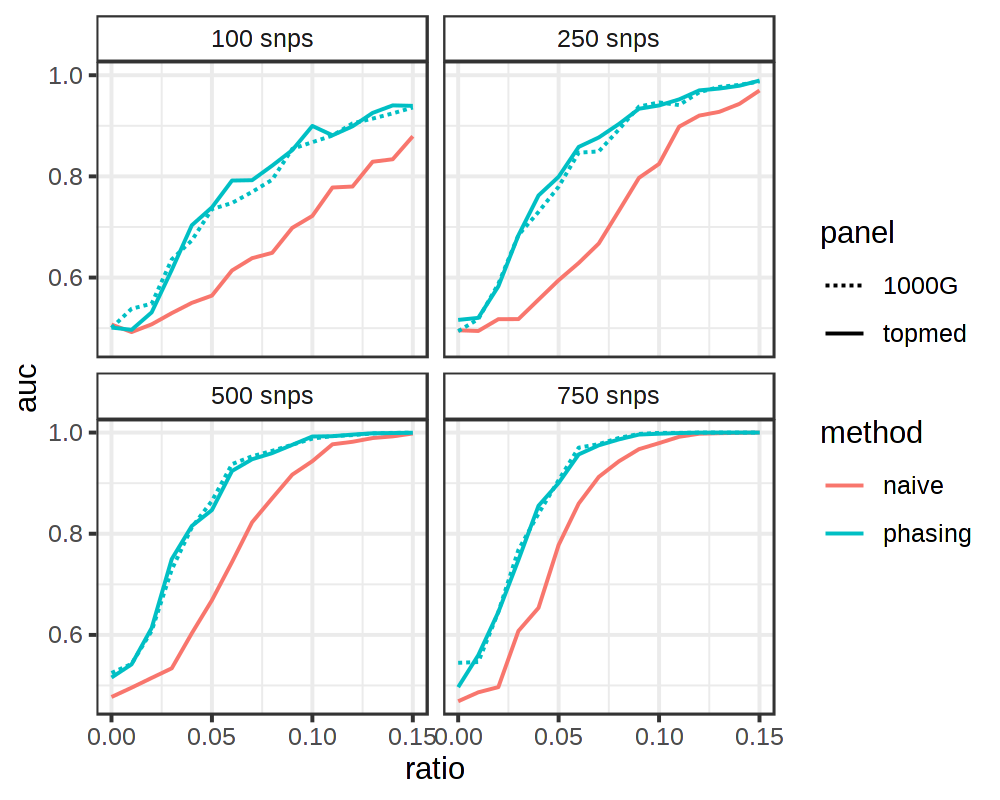

In [450]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
#lambda=1
rbind(
    scores[['topmed']] %>% mutate(panel = 'topmed'),
    scores[['1000G']] %>% mutate(panel = '1000G')
) %>%
group_by(method, panel, ratio, l) %>%
mutate(panel = ifelse(method == 'naive', 'topmed', panel)) %>%
summarise(
     auc = as.numeric(pROC::auc(label, LLR, direction = '<', levels = levels(as.factor(label)))),
    .groups = 'drop'
) %>%
mutate(l = glue("{l} snps")) %>%
ggplot(
) + 
geom_line(aes(x = ratio, y = auc, color = method, linetype = panel)) +
theme_bw() +
theme(
    strip.background = element_rect(fill = NA)
) +
scale_linetype_manual(values = c('dashed', 'solid')) +
facet_wrap(~l, nrow = 2)

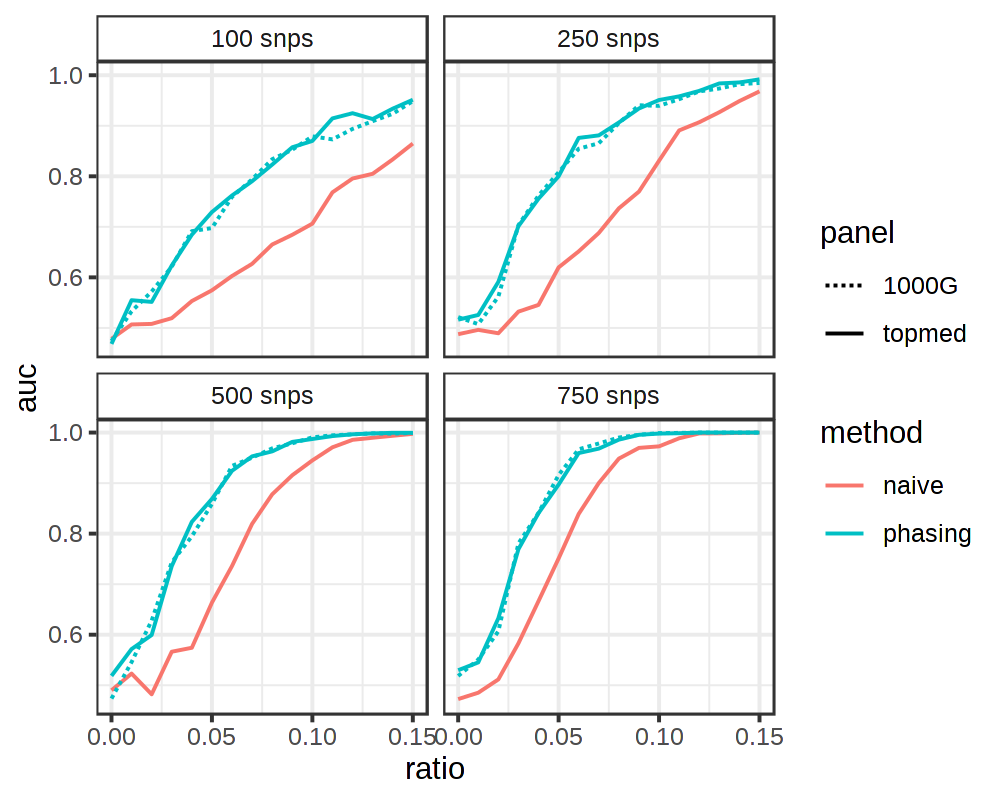

In [359]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
#lambda=2
rbind(
    scores[['topmed']] %>% mutate(panel = 'topmed'),
    scores[['1000G']] %>% mutate(panel = '1000G')
) %>%
group_by(method, panel, ratio, l) %>%
mutate(panel = ifelse(method == 'naive', 'topmed', panel)) %>%
summarise(
     auc = as.numeric(pROC::auc(label, LLR, direction = '<', levels = levels(as.factor(label)))),
    .groups = 'drop'
) %>%
mutate(l = glue("{l} snps")) %>%
ggplot(
) + 
geom_line(aes(x = ratio, y = auc, color = method, linetype = panel)) +
theme_bw() +
theme(
    strip.background = element_rect(fill = NA)
) +
scale_linetype_manual(values = c('dashed', 'solid')) +
facet_wrap(~l, nrow = 2)

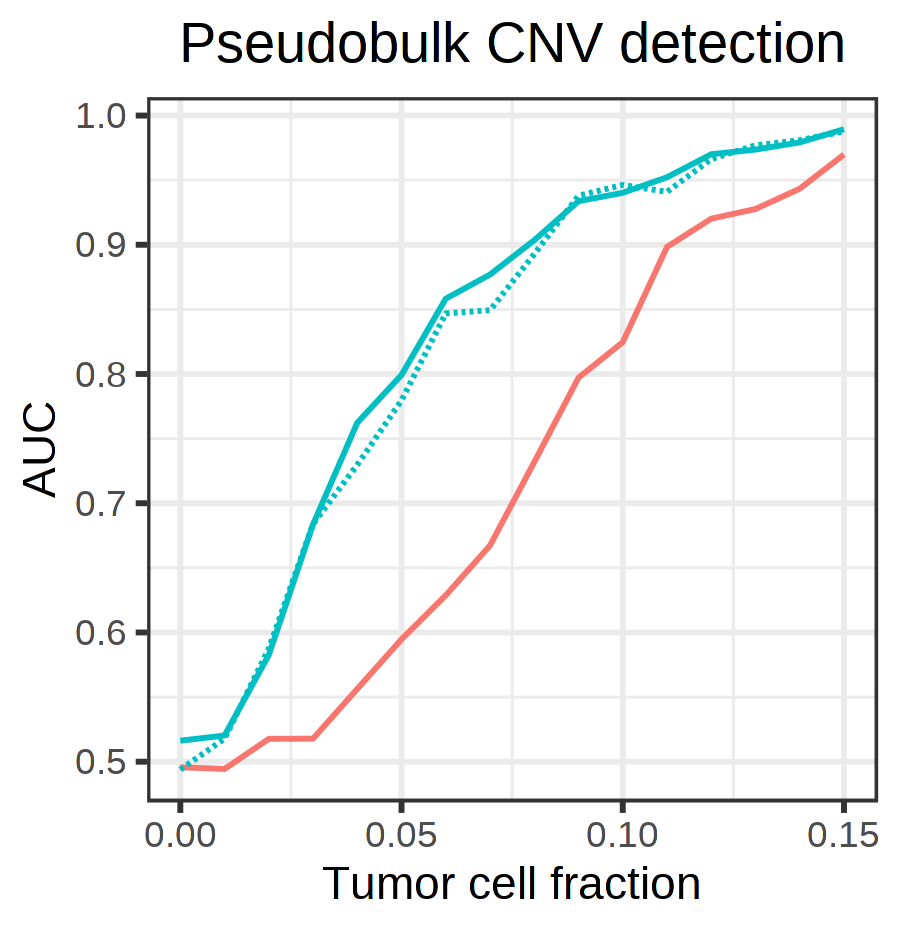

In [728]:
options(repr.plot.width = 3, repr.plot.height = 3.1, repr.plot.res = 300)
#lambda=1
rbind(
    scores[['topmed']] %>% mutate(panel = 'topmed'),
    scores[['1000G']] %>% mutate(panel = '1000G')
) %>%
group_by(method, panel, ratio, l) %>%
mutate(panel = ifelse(method == 'naive', 'topmed', panel)) %>%
summarise(
     auc = as.numeric(pROC::auc(label, LLR, direction = '<', levels = levels(as.factor(label)))),
    .groups = 'drop'
) %>%
filter(l == 250) %>%
ggplot(
) + 
geom_line(aes(x = ratio, y = auc, color = method, linetype = panel)) +
theme_bw() +
theme(
    strip.background = element_rect(fill = NA),
    plot.title = element_text(hjust = 0.5),
    legend.position = 'none'
) +
scale_linetype_manual(values = c('dashed', 'solid')) +
xlab('Tumor cell fraction') +
ylab('AUC') +
ggtitle('Pseudobulk CNV detection')

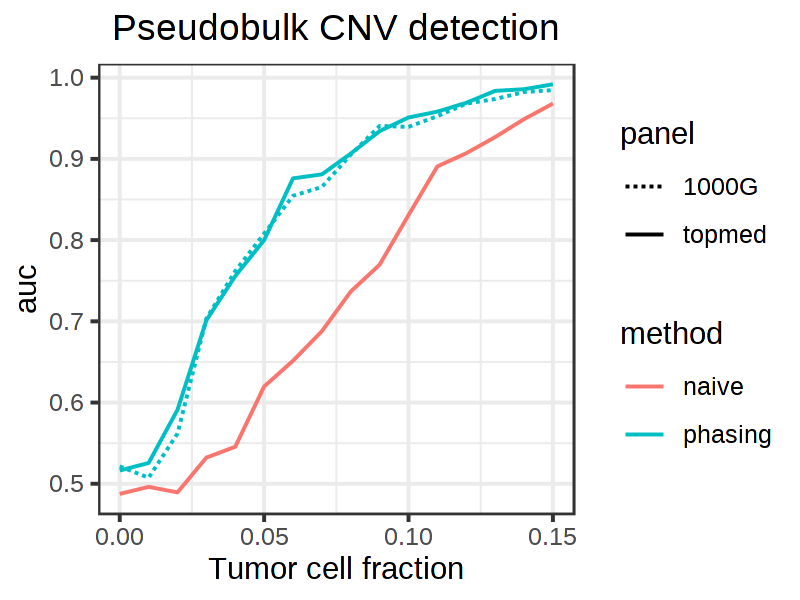

In [412]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
#lambda=2
rbind(
    scores[['topmed']] %>% mutate(panel = 'topmed'),
    scores[['1000G']] %>% mutate(panel = '1000G')
) %>%
group_by(method, panel, ratio, l) %>%
mutate(panel = ifelse(method == 'naive', 'topmed', panel)) %>%
summarise(
     auc = as.numeric(pROC::auc(label, LLR, direction = '<', levels = levels(as.factor(label)))),
    .groups = 'drop'
) %>%
filter(l == 250) %>%
ggplot(
) + 
geom_line(aes(x = ratio, y = auc, color = method, linetype = panel)) +
theme_bw() +
theme(
    strip.background = element_rect(fill = NA),
    plot.title = element_text(hjust = 0.5)
) +
scale_linetype_manual(values = c('dashed', 'solid')) +
xlab('Tumor cell fraction') +
ggtitle('Pseudobulk CNV detection')

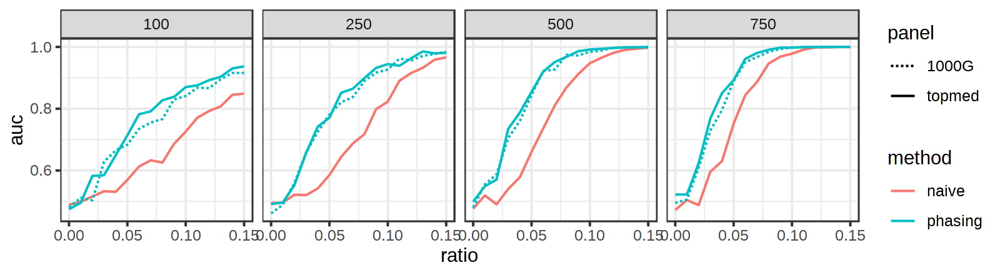

In [29]:
options(repr.plot.width = 8, repr.plot.height = 2.2, repr.plot.res = 200)
#lambda = 0.5
rbind(
    scores[['topmed']] %>% mutate(panel = 'topmed'),
    scores[['1000G']] %>% mutate(panel = '1000G')
) %>%
group_by(method, panel, ratio, l) %>%
mutate(panel = ifelse(method == 'naive', 'topmed', panel)) %>%
summarise(
     auc = as.numeric(pROC::auc(label, LLR, direction = '<', levels = levels(as.factor(label)))),
    .groups = 'drop'
) %>%
ggplot(
) + 
geom_line(aes(x = ratio, y = auc, color = method, linetype = panel)) +
theme_bw() +
scale_linetype_manual(values = c('dashed', 'solid')) +
facet_wrap(~l, nrow = 1)

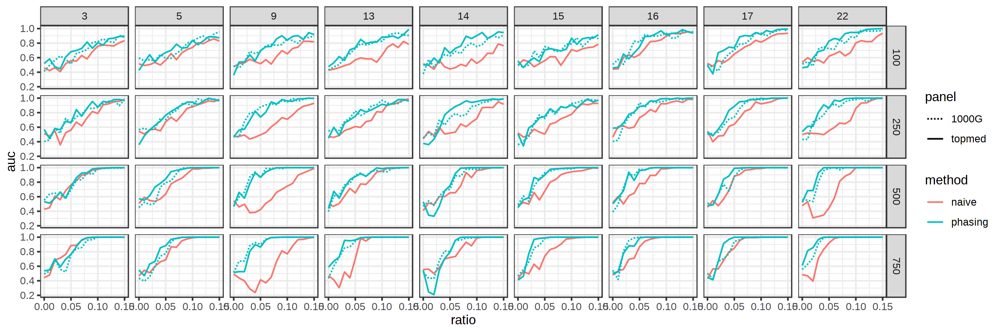

In [30]:
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 200)

rbind(
    scores[['topmed']] %>% mutate(panel = 'topmed'),
    scores[['1000G']] %>% mutate(panel = '1000G')
) %>%
group_by(method, panel, ratio, l, chr) %>%
mutate(panel = ifelse(method == 'naive', 'topmed', panel)) %>%
summarise(
     auc = as.numeric(pROC::auc(label, LLR, direction = '<', levels = levels(as.factor(label)))),
    .groups = 'drop'
) %>%
ggplot(
) + 
geom_line(aes(x = ratio, y = auc, color = method, linetype = panel)) +
theme_bw() +
scale_linetype_manual(values = c('dashed', 'solid'))  +
facet_grid(l~chr)

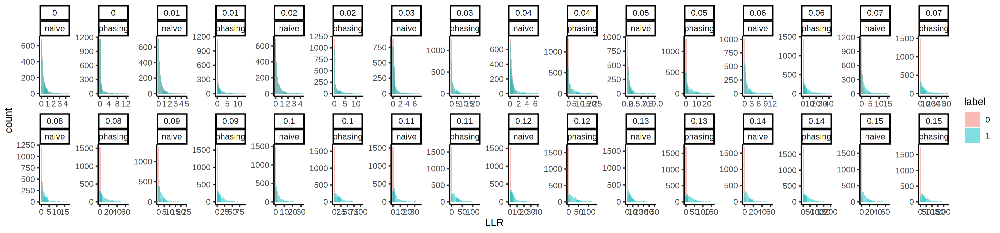

In [69]:
options(repr.plot.width = 15, repr.plot.height = 3.5, repr.plot.res = 200)

ggplot(
    scores[['topmed']] %>% mutate(label = factor(label)),
    aes(x = LLR, fill = label)
) +
geom_histogram(position = 'identity', bins = 30, alpha = 0.5) +
theme_classic() +
facet_wrap(~ratio+method, scales = 'free', nrow = 2) +
theme()

## Visualize

In [1168]:
plot_seg = function(start_random, end_random, chr, seed, ratios, min_depth = 5) {
    
    bulk_seg = bulks_event[['topmed']][paste0(ratios, '_', seed)] %>%
        lapply(function(bulk){
            bulk %>% 
                filter(CHROM == chr) %>%
                filter(snp_index <= end_random & snp_index >= start_random) %>%
                filter(!is.na(AD)) %>%
                analyze_bulk_lnpois(classify_allele = T, retest = F, verbose = F, diploid_chroms = c(chr)) %>%
                annot_haplo_segs() %>%
                ungroup() %>%
                mutate(theta_hat_roll = theta_hat_roll(pAD, DP-pAD, h = 20)) %>%
                group_by(seg) %>%
                mutate(HF = sum(pAD)/sum(DP)) %>%
                ungroup()
        }) %>%
        bind_rows()
    
    LLRs = bulk_seg %>% 
        group_by(ratio) %>%
        mutate(MAD = ifelse(AD >= DP - AD, AD, DP-AD)) %>%
        summarise(
            approx_lik_ar(pAD, DP, p_s, gamma = gamma),
            phasing = calc_allele_LLR(
                pAD[!is.na(pAD)], DP[!is.na(pAD)], p_s[!is.na(pAD)], theta_mle, gamma = unique(gamma)
            ),
            theta_mle_naive(MAD, DP),
            naive = l_bbinom(MAD, DP, gamma*(0.5+theta_mle), gamma*(0.5-theta_mle)) - 
                l_bbinom(MAD, DP, gamma*(0.5+theta_neu), gamma*(0.5-theta_neu)),
        ) %>%
        reshape2::melt(measure.vars = c('phasing', 'naive'), variable.name = 'method', value.name = 'LLR') %>%
        mutate(variable = ifelse(method == 'phasing', 'pHF', 'BAF'))

    D = bulk_seg %>% 
        filter(DP >= min_depth) %>% 
        group_by(ratio) %>%
        mutate(snp_index = 1:n()) %>%
        ungroup() %>%
        rename(pHF = pBAF, BAF = AR) %>%
        reshape2::melt(measure.vars = c('pHF', 'BAF')) %>%
        mutate(state = ifelse(variable == 'BAF' | ratio == 0, 'neu_down', state)) %>%
        mutate(variable = factor(variable, c('BAF', 'pHF')))

    ggplot(
        D %>% filter(DP >= min_depth),
        aes(x = snp_index, y = value, color = state),
        na.rm=TRUE
    ) +
    geom_hline(yintercept = 0.5, linetype = 'dashed', color = 'gray50') +
    geom_point(
        size = 1.2,
        alpha = 0.5,
        shape = 16
    ) +
    theme_classic() +
    theme(
        panel.spacing = unit(1, 'mm'),
        panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
#         strip.background = element_blank(),
        strip.background = element_rect(fill = 'gray90', size = 0)
    ) +
    geom_path(
        data = D %>% 
            filter(ratio != 0 & variable == 'pHF'),
        aes(x = snp_index, y = HF, group = seg, color = state),
        lineend = 'round', 
        color = 'darkred', 
        linetype = 'dashed',
        size = 0.3
    ) +
    geom_text(
        data = LLRs,
        inherit.aes = F,
        aes(x = 1, y = 0, label = paste0('LLR=', round(LLR, 2))),
        size = 3.5,
        hjust = 0,
        vjust = 0
    ) +
    facet_grid(ratio ~ variable, scale = 'free_x', space = 'free_x') +
    guides(color = "none", fill = FALSE, alpha = FALSE, shape = FALSE) +
    ylim(0,1) +
    scale_color_manual(values = cnv_colors) +
    scale_x_continuous(expand = expansion(add = 1))
}

seed,chr,l,label,ratio,id_random,start_random,end_random,naive,phasing
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>
1,3,250,1,0.05,5,1335,1585,0.1338976,1.270847
1,3,250,1,0.10,5,102,352,0.3363064,11.493967
1,3,250,1,0.15,5,412,662,7.6844915,11.510533


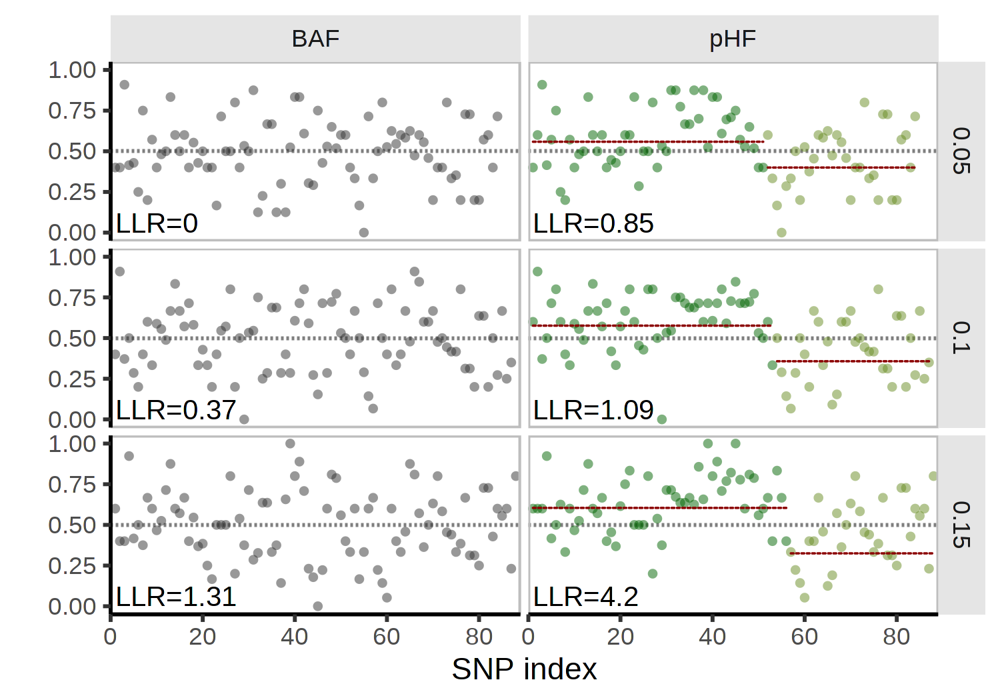

In [1169]:
options(repr.plot.width = 5, repr.plot.height = 3.5, repr.plot.res = 300)
seg = readRDS('~/results/benchmark/seg_illustration.rds')

ratios = c(0.05, 0.1, 0.15)

plot_seg(
    start_random = seg$start_random, 
    end_random = seg$end_random, 
    chr = seg$chr,
    seed = seg$seed,
    ratios = ratios,
    min_depth = 5
) +
ylab('') +
xlab('SNP index')

scores[['topmed']] %>% 
    filter(ratio %in% ratios & label == 1 & id_random == seg$id_random & chr == seg$chr & seed == seg$seed & l == seg$l) %>%
    reshape2::dcast(seed + chr + l + label + ratio + id_random + start_random + end_random ~ method, value.var = 'LLR') %>%
    display

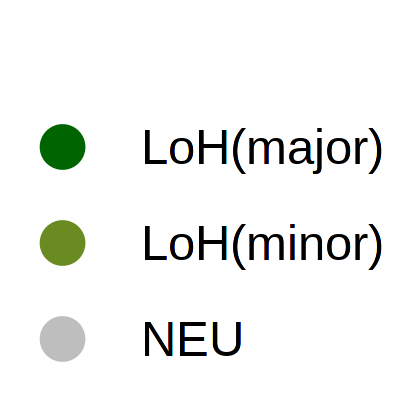

In [1143]:
options(repr.plot.width = 1, repr.plot.height = 1, repr.plot.res = 400)

p = data.frame(
        state = c('LoH(major)', 'LoH(minor)', 'NEU')
    ) %>%
    ggplot(
        aes(x = 1, y = 1, color = state)
    ) +
    geom_point() +
    scale_color_manual(
        values = c(cnv_colors[['loh_up']], cnv_colors[['loh_down']], cnv_colors[['neu']])
    ) +
    guides(color = guide_legend(title = "", override.aes = aes(size = 3))) +
    theme_classic()

as_ggplot(get_legend(p))

In [1112]:
start_random = seg$start_random
end_random = seg$end_random
chr = seg$chr
seed = seg$seed
ratios = c(0.05, 0.1, 0.15)

bulk_seg = bulks_event[['topmed']][paste0(ratios, '_', seed)] %>%
    lapply(function(bulk){
        bulk %>% 
            filter(CHROM == chr) %>%
            filter(snp_index <= end_random & snp_index >= start_random) %>%
            filter(!is.na(AD)) %>%
            analyze_bulk_lnpois(classify_allele = T, retest = F, verbose = F, diploid_chroms = c(chr)) %>%
            annot_haplo_segs() %>%
            group_by(seg) %>%
            mutate(HF = sum(pAD)/sum(DP)) %>%
            ungroup()
    }) %>%
    bind_rows()

LLRs = bulk_seg %>% 
    group_by(ratio) %>%
    mutate(MAD = ifelse(AD >= DP - AD, AD, DP-AD)) %>%
    summarise(
        approx_lik_ar(pAD, DP, p_s, gamma = gamma),
        phasing = calc_allele_LLR(
            pAD[!is.na(pAD)], DP[!is.na(pAD)], p_s[!is.na(pAD)], theta_mle, gamma = unique(gamma)
        ),
        theta_mle_naive(MAD, DP),
        naive = l_bbinom(MAD, DP, gamma*(0.5+theta_mle), gamma*(0.5-theta_mle)) - 
            l_bbinom(MAD, DP, gamma*(0.5+theta_neu), gamma*(0.5-theta_neu)),
    ) %>%
    reshape2::melt(measure.vars = c('phasing', 'naive'), variable.name = 'method', value.name = 'LLR')

LLRs

ratio,theta_mle,theta_sigma,method,LLR
<dbl>,<dbl>,<dbl>,<fct>,<dbl>
0.05,0.1649968,0.01538209,phasing,0.854352362
0.10,0.1790380,0.01493998,phasing,1.091826079
0.15,0.1903457,0.01481607,phasing,4.198776786
0.05,0.1649968,0.01538209,naive,0.002402114
0.10,0.1790380,0.01493998,naive,0.372743406
0.15,0.1903457,0.01481607,naive,1.311667456


In [1004]:
segs_sample = scores[['topmed']] %>% 
    filter(ratio == 0.1 & label == 1) %>%
    distinct(chr, start_random, end_random, method, `.keep_all` = T) %>%
    reshape2::dcast(seed + chr + l + label + id_random + start_random + end_random ~ method, value.var = 'LLR') %>%
    filter(phasing > 10 & naive < 1 & l == 250) %>%
    arrange(-phasing) %>%
    distinct(chr, .keep_all = T)

segs_sample

seed,chr,l,label,id_random,start_random,end_random,naive,phasing
<int>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>
4,16,250,1,6,848,1098,0.9251389,22.76219
2,22,250,1,3,257,507,0.3344667,21.00204
3,9,250,1,6,265,515,0.9147560,20.22886
3,15,250,1,4,597,847,0.8418012,16.52490
4,5,250,1,8,906,1156,0.5720497,16.42569
1,14,250,1,5,1134,1384,0.0930753,14.47576
3,13,250,1,9,828,1078,0.0209031,13.20513
1,3,250,1,5,102,352,0.3363064,11.49397


In [972]:
# saveRDS(scores, '~/results/benchmark/bulk_cnv_scores_jan.rds')
# saveRDS(bulks_event, '~/results/benchmark/bulks_event_jan.rds')

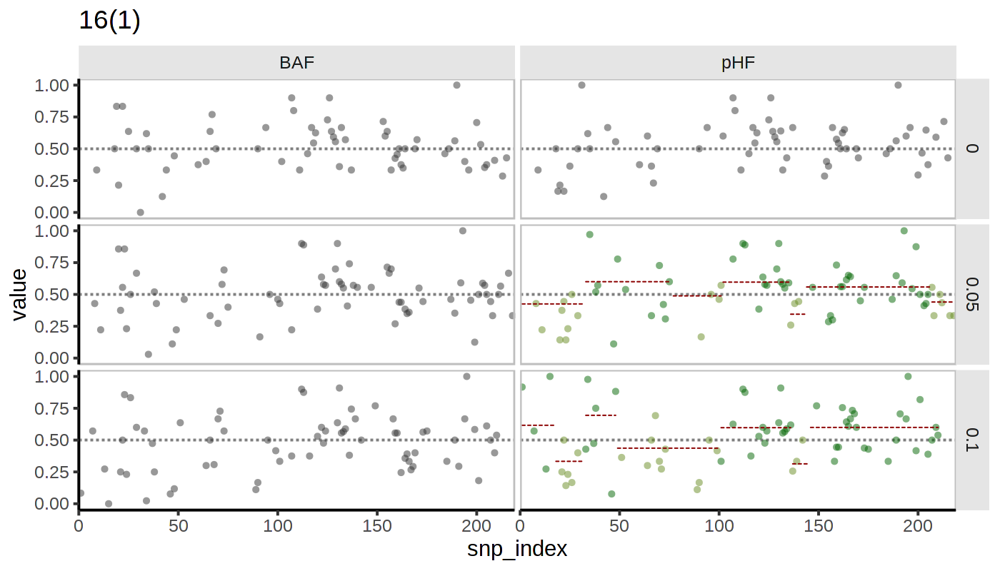

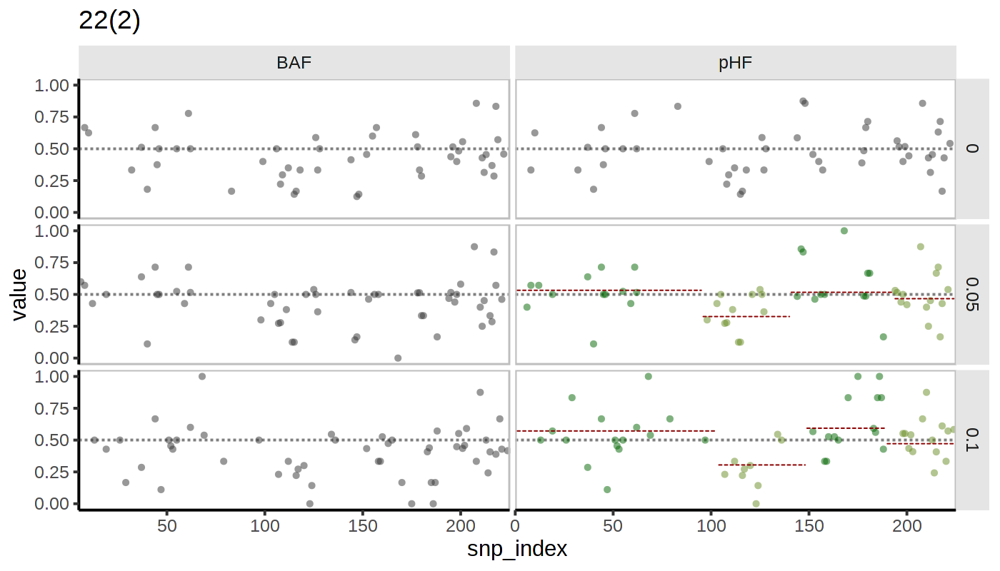

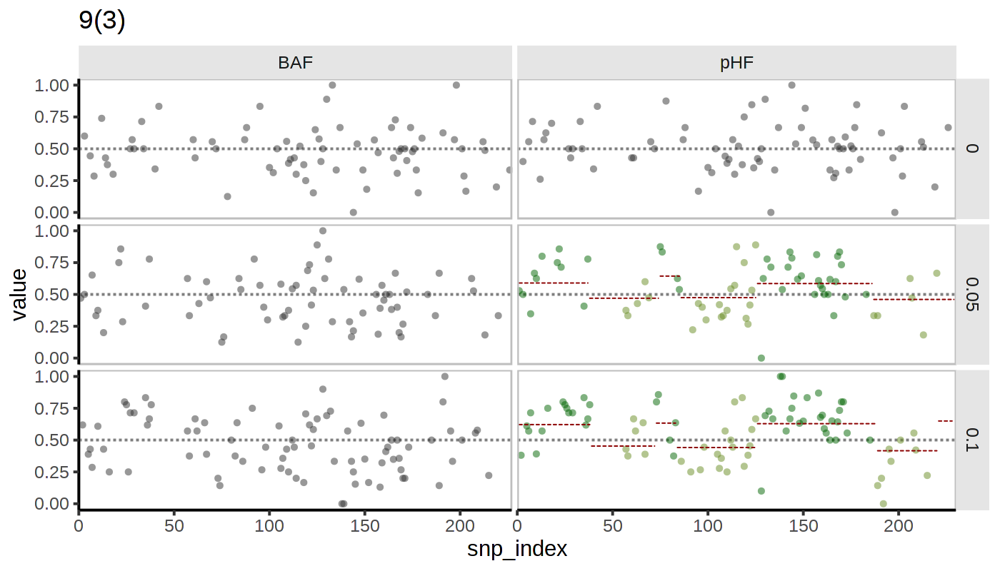

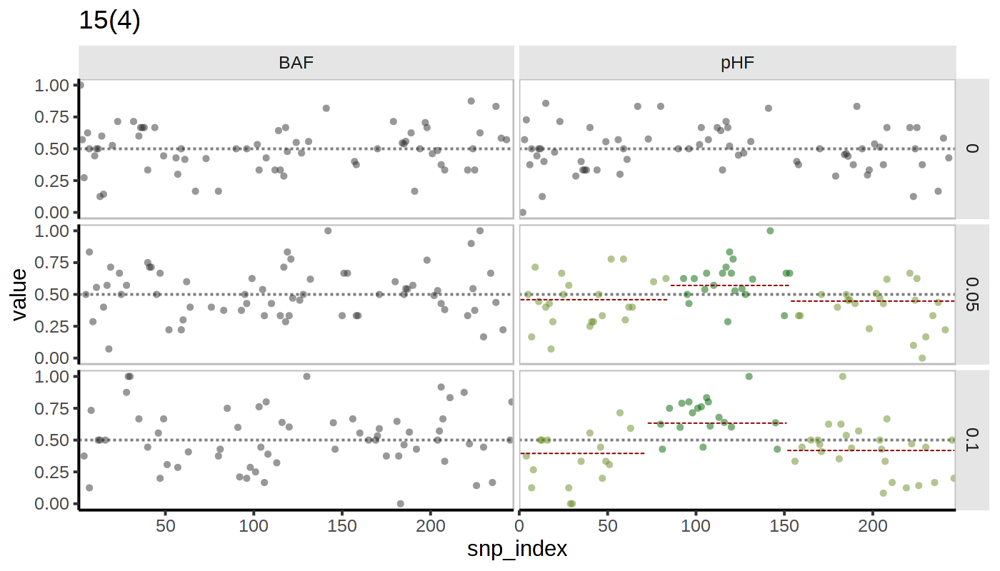

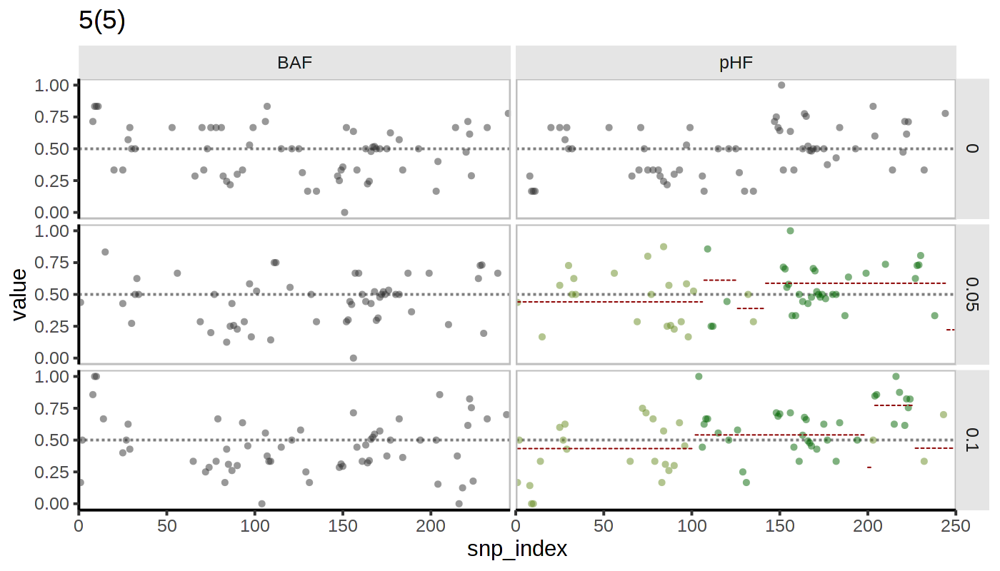

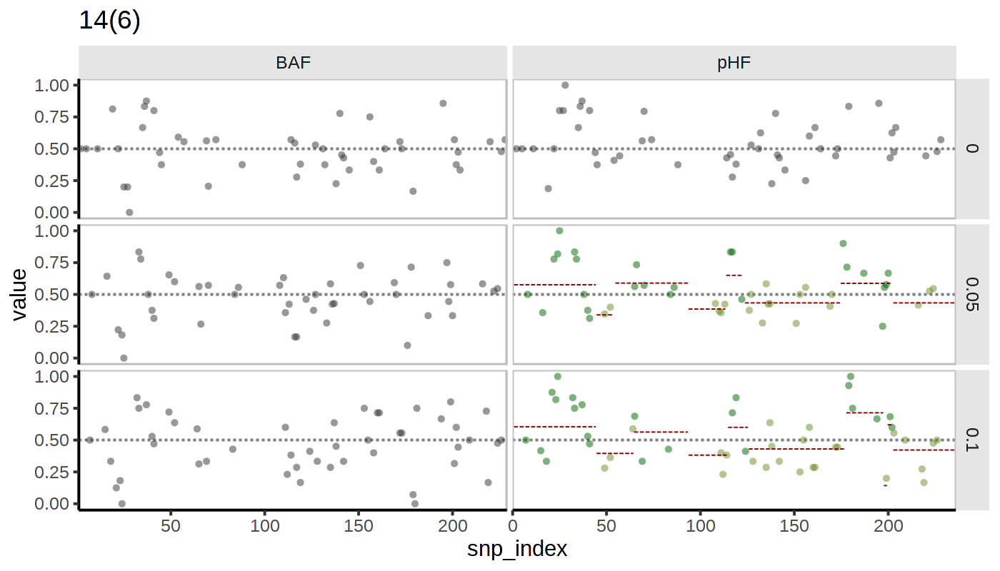

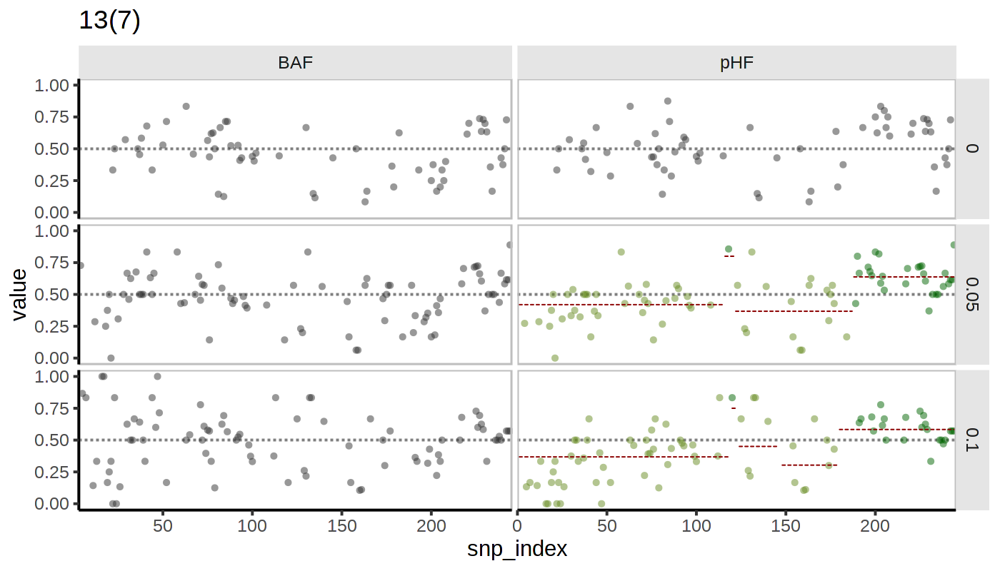

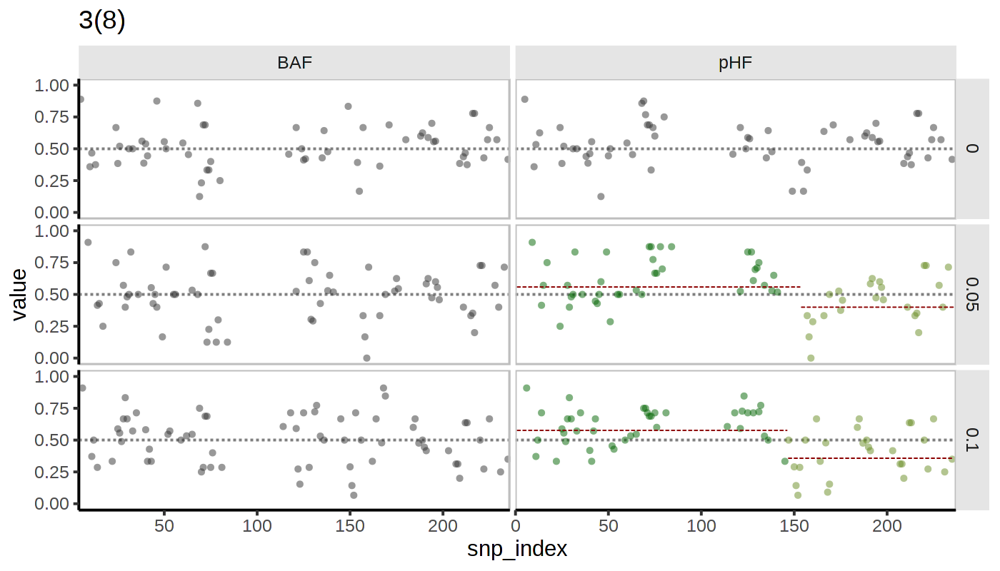

In [1006]:
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

for (i in 1:nrow(segs_sample)) {
    
    seg = segs_sample[i,]
    
    p = plot_seg(
        start_random = seg$start_random, 
        end_random = seg$end_random, 
        chr = seg$chr,
        seed = seg$seed,
        ratios =  c(0, 0.05, 0.1)
    ) + 
    ggtitle(paste0(seg$chr, '(', i, ')'))
    
    display(p)
    
}

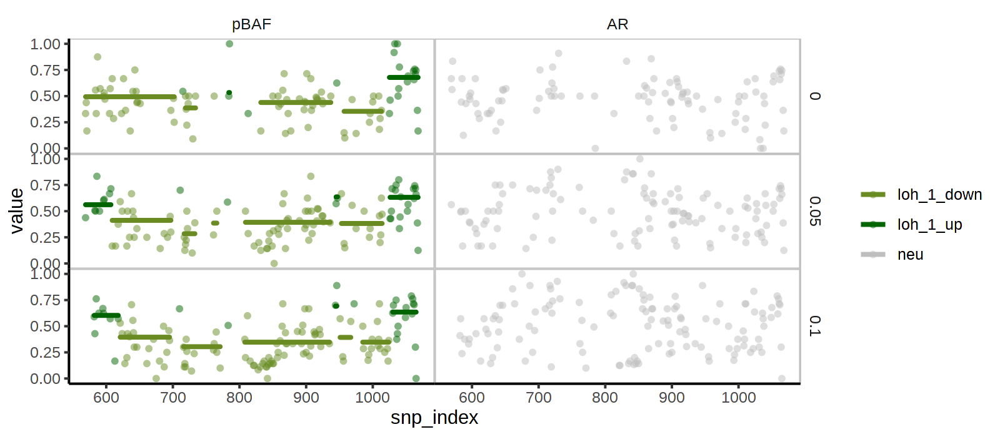

In [864]:
options(repr.plot.width = 8, repr.plot.height = 3.5, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

start_random = 569
end_random = 1069
chr = 13
seed = 1
ratios = c(0, 0.05, 0.1)

bulk_seg = bulks_event[['topmed']][paste0(ratios, '_', seed)] %>%
    lapply(function(bulk){
        bulk %>% 
            filter(CHROM == chr) %>%
            filter(snp_index <= end_random & snp_index >= start_random) %>%
            filter(!is.na(AD)) %>%
            analyze_bulk_lnpois(classify_allele = T, retest = F, verbose = F, diploid_chroms = c(chr)) %>%
            annot_haplo_segs() %>%
            group_by(seg) %>%
            mutate(HF = sum(pAD)/sum(DP)) %>%
            ungroup()
    }) %>%
    bind_rows()

D = bulk_seg %>% 
    filter(DP > 5) %>%
    reshape2::melt(measure.vars = c('pBAF', 'AR')) %>%
    mutate(state = ifelse(variable == 'AR', 'neu', state))

ggplot(
    D,
    aes(x = snp_index, y = value, color = state),
    na.rm=TRUE
) +
geom_point(
    size = 1.5,
    alpha = 0.5,
    shape = 16
) +
theme_classic() +
theme(
    panel.spacing = unit(0, 'mm'),
    panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
    strip.background = element_blank()
) +
geom_path(
    data = D %>% filter(variable == 'pBAF'),
    aes(x = snp_index, y = HF, group = seg, color = state), lineend = 'round', 
#     color = 'darkred', 
    size = 1
) +
facet_grid(ratio ~ variable, scale = 'free_x', space = 'free_x') +
guides(color = guide_legend(""), fill = FALSE, alpha = FALSE, shape = FALSE) +
ylim(0,1) +
scale_color_manual(values = cnv_colors)

In [717]:
bulk_seg %>%
group_by(ratio) %>%
mutate(MAD = ifelse(AD >= DP - AD, AD, DP-AD)) %>%
summarise(
    theta_mle_naive(MAD, DP),
    LLR = l_bbinom(MAD, DP, gamma*(0.5+theta_mle), gamma*(0.5-theta_mle)) - 
        l_bbinom(MAD, DP, gamma*(0.5+theta_neu), gamma*(0.5-theta_neu)),
    start_random = unique(start_random),
    end_random = unique(end_random),
    .groups = 'drop'
)

ratio,theta_mle,theta_sigma,LLR,start_random,end_random
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.00,0.1643980,0.01154948,0.2061402,569,1069
0.03,0.1703863,0.01111095,0.7218123,569,1069
0.10,0.2128379,0.01066762,12.9275319,569,1069


In [715]:
bulk_seg %>%
group_by(ratio) %>%
summarise(
    approx_lik_ar(pAD, DP, p_s, gamma = gamma),
    l_1 = calc_allele_lik(
        pAD[!is.na(pAD)], DP[!is.na(pAD)], p_s[!is.na(pAD)], theta = theta_mle, gamma = gamma
    ),
    l_0 = l_bbinom(AD, DP, gamma*0.5, gamma*0.5),
    LLR = l_1 - l_0,
    start_random = unique(start_random),
    end_random = unique(end_random),
    .groups = 'drop'
)

ratio,theta_mle,theta_sigma,l_1,l_0,LLR,start_random,end_random
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.00,0.03986870,0.01608389,-595.2927,-596.6697,1.37708,569,1069
0.03,0.08805813,0.01231709,-618.2859,-634.7786,16.49268,569,1069
0.10,0.13054988,0.01169562,-641.1448,-688.4182,47.27345,569,1069
